In [1]:
import statistics as st
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
import random
import math
from keras.regularizers import l1, l2
from keras.regularizers import l1_l2
from keras.callbacks import EarlyStopping, ModelCheckpoint
import time
from collections import Counter
from scipy.signal import find_peaks
import collections
from sklearn.preprocessing import MinMaxScaler
from sklearn.decomposition import PCA
from sklearn.decomposition import KernelPCA
from sklearn.manifold import TSNE
from sklearn.manifold import MDS
import matplotlib.colors as colors
from sklearn.manifold import Isomap
import keras_tuner
from keras_tuner.tuners import Hyperband
from tensorflow.keras.optimizers import Adam

In [4]:
sim_FF_df = pd.read_csv('form_factors.csv')
sim_TD_x_df = pd.read_csv('gpr_total_density_x_200.csv')
sim_TD_y_df = pd.read_csv('gpr_total_density_y_200.csv')

sim_FF_df = sim_FF_df.transpose()
sim_TD_x_df = sim_TD_x_df.transpose()
sim_TD_y_df = sim_TD_y_df.transpose()

exp_FF = pd.read_json('experiment_formfactors.json')
exp_FF_list = []
for i in range(0,exp_FF.shape[1]):
    x_start = round(exp_FF.iloc[0,i][0],4)
    x_end = round(exp_FF.iloc[0,i][-1],4)
    front_zeros = int(round(x_start/0.001))
    print(i,exp_FF.iloc[0,i])
    print('')
    if front_zeros == 0:
        exp_FF_list.append(np.concatenate((exp_FF.iloc[1,i], np.zeros(1000 - len(exp_FF.iloc[1,i])))))
        continue
    
    front_padding = np.concatenate((np.zeros(front_zeros), exp_FF.iloc[1,i]))
    back_padding = np.concatenate((front_padding, np.zeros(1000 - len(front_padding))))
    exp_FF_list.append(back_padding)
        
exp_FF_df = pd.DataFrame(exp_FF_list)
exp_FF_df = exp_FF_df.transpose()

0 [0.060700000000000004, 0.06158, 0.06246000000000001, 0.06334000000000001, 0.06422, 0.0651, 0.06598000000000001, 0.06686, 0.06774000000000001, 0.06862, 0.0695, 0.07038000000000001, 0.07126, 0.07214000000000001, 0.07302, 0.07390000000000001, 0.07478, 0.07566, 0.07654000000000001, 0.07741, 0.07830000000000001, 0.07917, 0.08005000000000001, 0.08093, 0.08181000000000001, 0.08269000000000001, 0.08357, 0.08445000000000001, 0.08533, 0.08621000000000001, 0.08709, 0.08797, 0.08885000000000001, 0.08973, 0.09061000000000001, 0.09149, 0.09237000000000001, 0.09325000000000001, 0.09413, 0.09501000000000001, 0.09588, 0.09677000000000001, 0.09764, 0.09852000000000001, 0.0994, 0.10028000000000001, 0.10116000000000001, 0.10204, 0.10292000000000001, 0.1038, 0.10468000000000001, 0.10556000000000001, 0.10644, 0.10732000000000001, 0.1082, 0.10908000000000001, 0.10996, 0.11084000000000001, 0.11171, 0.11259000000000001, 0.11347000000000002, 0.11435000000000001, 0.11523000000000001, 0.11611, 0.116990000000000

In [48]:
exp_FF_df

,0,1,2,3,4,5,6,7,8,9,...,26,27,28,29,30,31,32,33,34,35
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
996,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
997,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
998,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


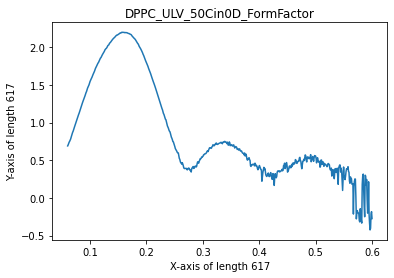

Range is 0.0607-0.5998
Average increment is 0.0008751623376623377



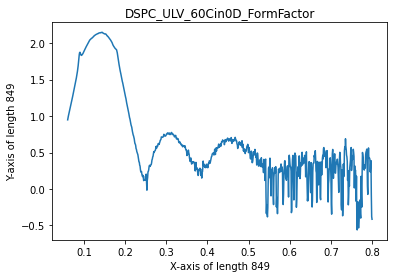

Range is 0.0607-0.79996
Average increment is 0.0008717688679245283



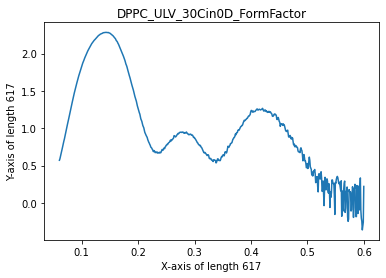

Range is 0.0607-0.5998
Average increment is 0.0008751623376623377



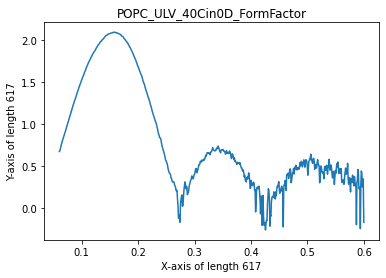

Range is 0.0607-0.5998
Average increment is 0.0008751623376623377



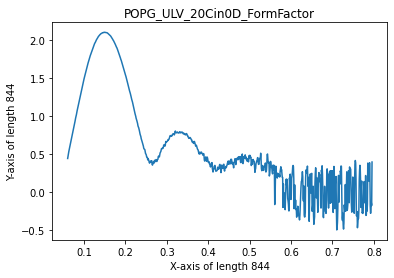

Range is 0.0607-0.79567
Average increment is 0.0008718505338078293



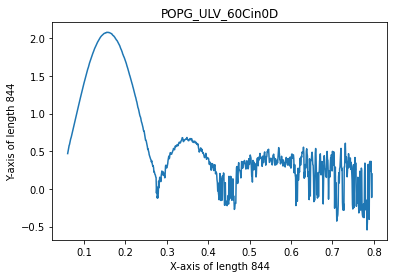

Range is 0.0607-0.79567
Average increment is 0.0008718505338078293



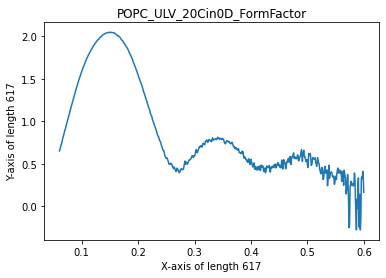

Range is 0.0607-0.5998
Average increment is 0.0008751623376623377



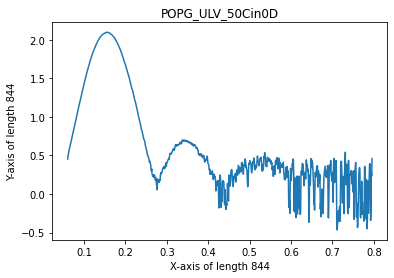

Range is 0.0607-0.79567
Average increment is 0.0008718505338078293



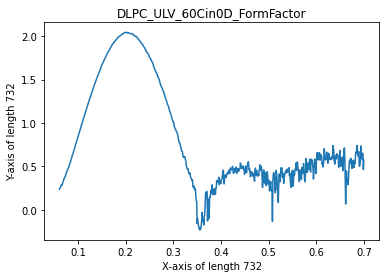

Range is 0.0607-0.69929
Average increment is 0.0008735841313269495



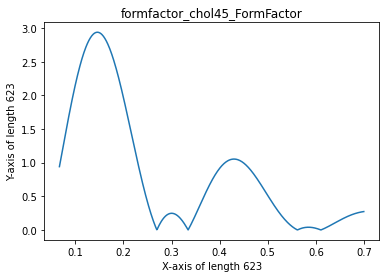

Range is 0.06722-0.69932
Average increment is 0.001016225884244373



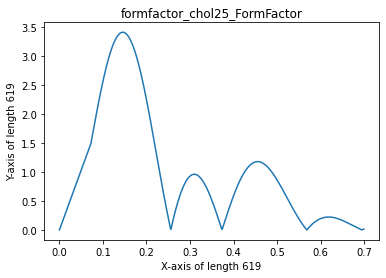

Range is 0.0-0.69932
Average increment is 0.0011315792880258898



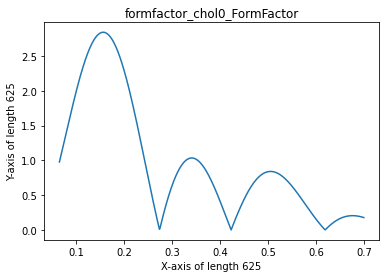

Range is 0.06519-0.69932
Average increment is 0.0010162261217948716



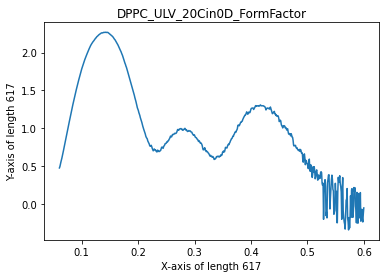

Range is 0.0607-0.5998
Average increment is 0.0008751623376623377



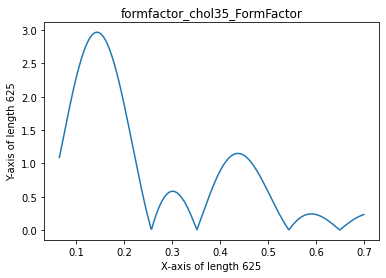

Range is 0.06519-0.69932
Average increment is 0.0010162261217948716



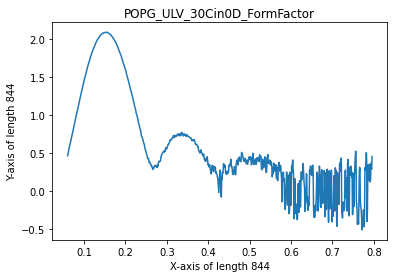

Range is 0.0607-0.79567
Average increment is 0.0008718505338078293



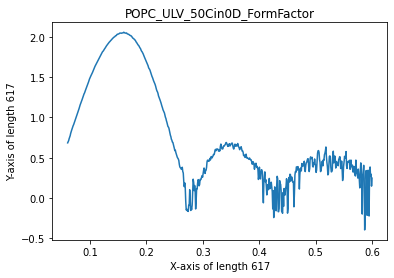

Range is 0.0607-0.5998
Average increment is 0.0008751623376623377



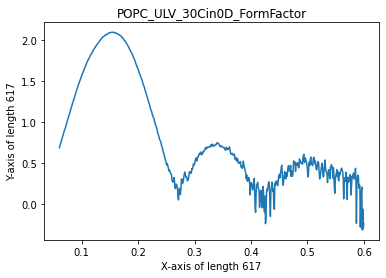

Range is 0.0607-0.5998
Average increment is 0.0008751623376623377



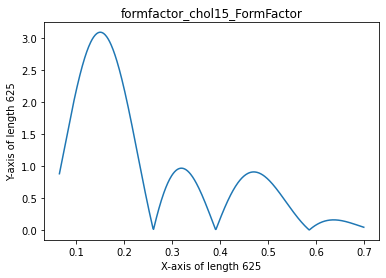

Range is 0.06519-0.69932
Average increment is 0.0010162261217948716



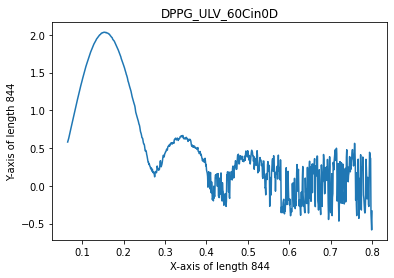

Range is 0.06509-0.79977
Average increment is 0.0008715124555160143



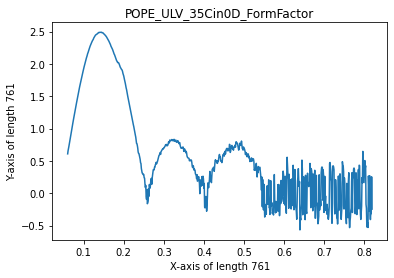

Range is 0.06-0.82
Average increment is 0.001



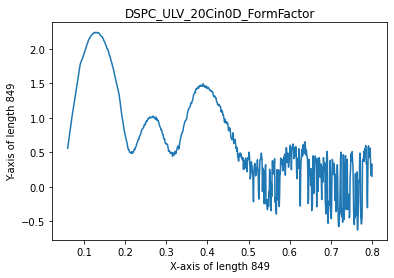

Range is 0.0607-0.79996
Average increment is 0.0008717688679245283



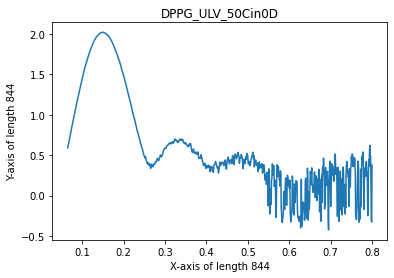

Range is 0.06509-0.79977
Average increment is 0.0008715124555160143



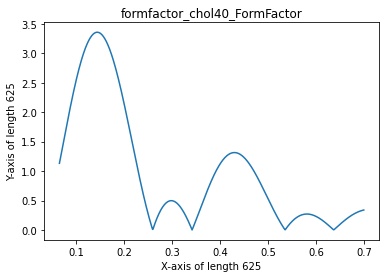

Range is 0.06519-0.69932
Average increment is 0.0010162261217948716



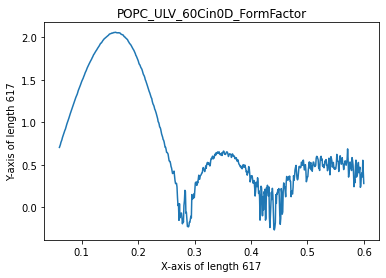

Range is 0.0607-0.5998
Average increment is 0.0008751623376623377



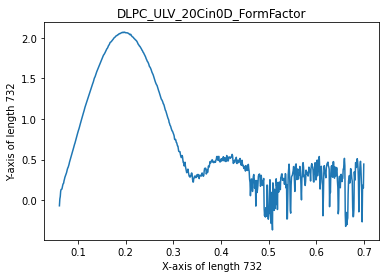

Range is 0.0607-0.69929
Average increment is 0.0008735841313269495



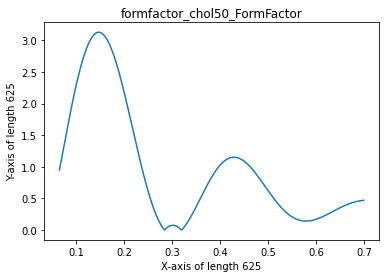

Range is 0.06519-0.69932
Average increment is 0.0010162261217948716



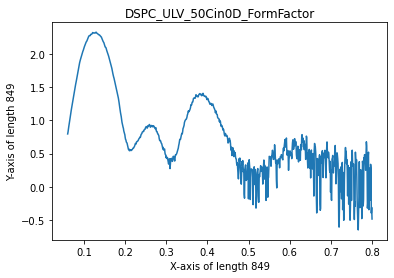

Range is 0.0607-0.79996
Average increment is 0.0008717688679245283



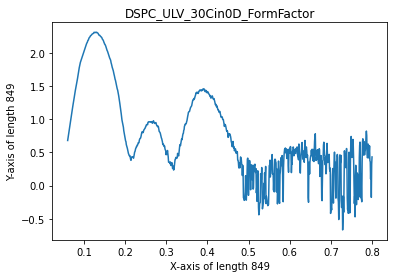

Range is 0.0607-0.79996
Average increment is 0.0008717688679245283



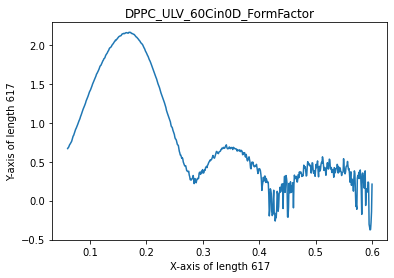

Range is 0.0607-0.5998
Average increment is 0.0008751623376623377



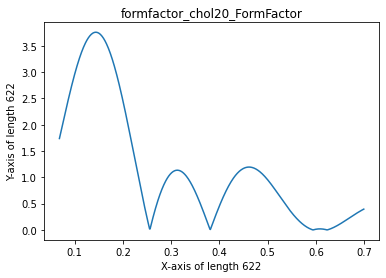

Range is 0.06824-0.69932
Average increment is 0.0010162259259259257



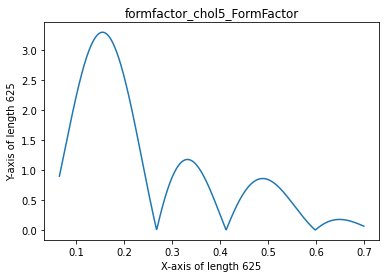

Range is 0.06519-0.69932
Average increment is 0.0010162261217948716



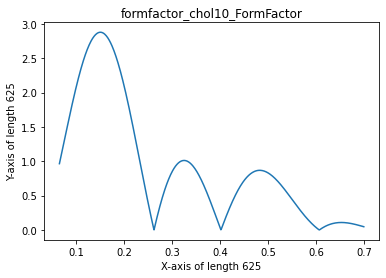

Range is 0.06519-0.69932
Average increment is 0.0010162261217948716



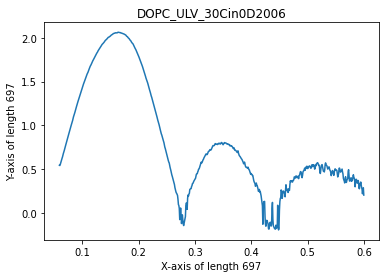

Range is 0.0593-0.59957
Average increment is 0.00077625



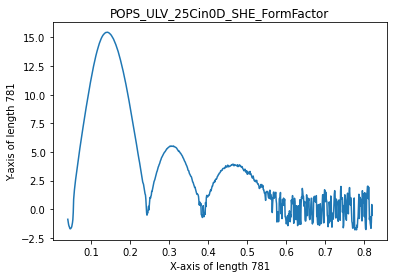

Range is 0.04-0.82
Average increment is 0.001



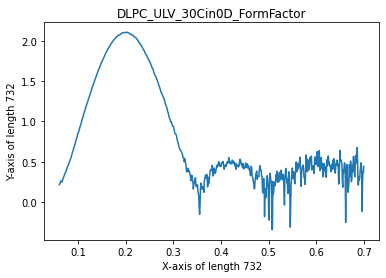

Range is 0.0607-0.69929
Average increment is 0.0008735841313269495



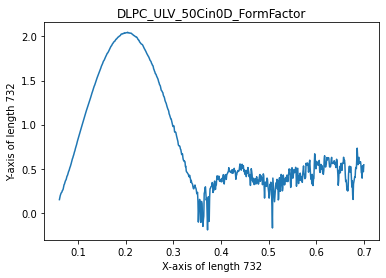

Range is 0.0607-0.69929
Average increment is 0.0008735841313269495



In [19]:
index = 0
for column in exp_FF.columns:
    plt.plot(exp_FF.iloc[0,index],exp_FF.iloc[1,index])
    plt.title(column)
    plt.xlabel('X-axis of length ' + str(len(exp_FF.iloc[0,index])))
    plt.ylabel('Y-axis of length ' + str(len(exp_FF.iloc[1,index])))
    plt.show()
    x_start = round(exp_FF.iloc[0,index][0],5)
    x_end = round(exp_FF.iloc[0,index][-1],5)
    average_increment = np.mean(np.diff(exp_FF.iloc[0,index]))
    print('Range is ' + str(x_start) + '-' + str(x_end))
    print('Average increment is ' + str(average_increment))
    print('')
    index = index + 1

In [31]:
exp_FF_df

,0,1,2,3,4,5,6,7,8,9,...,26,27,28,29,30,31,32,33,34,35
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
996,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
997,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
998,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


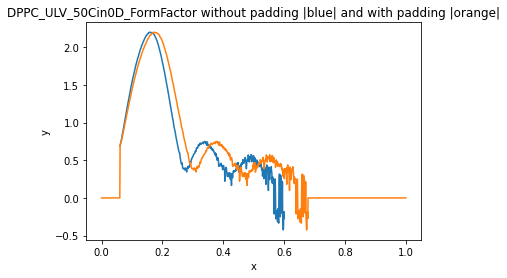

0



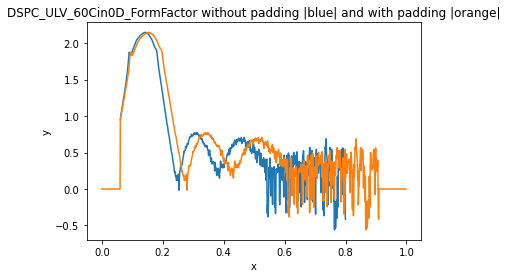

1



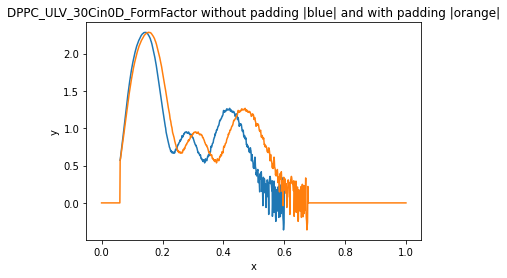

2



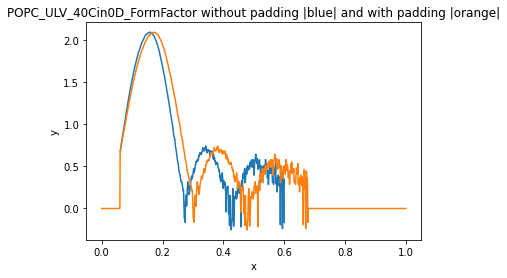

3



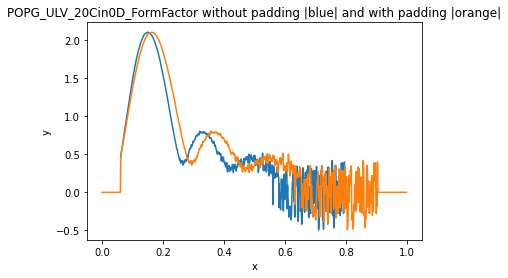

4



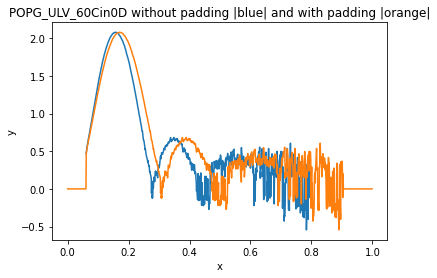

5



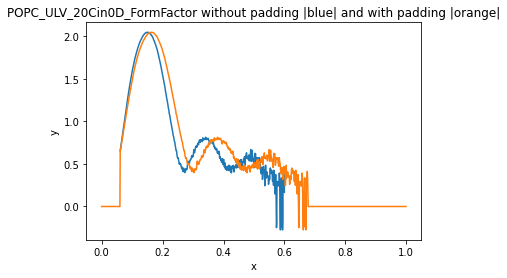

6



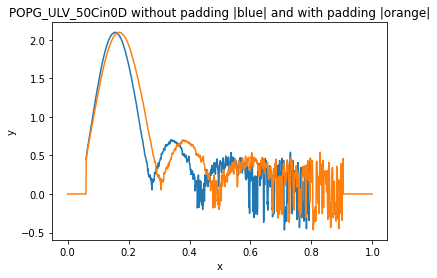

7



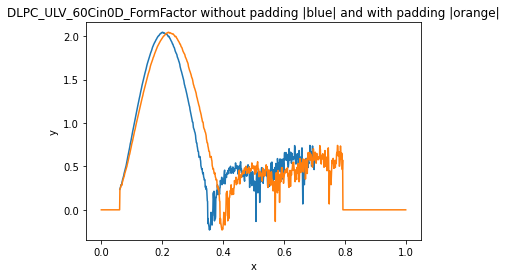

8



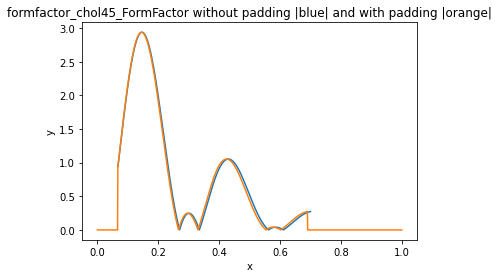

9



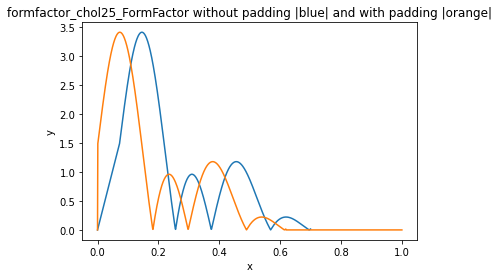

10



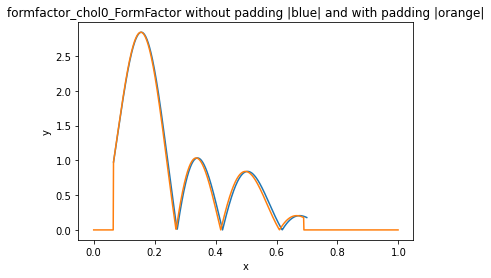

11



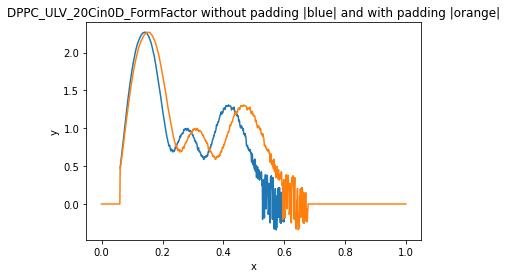

12



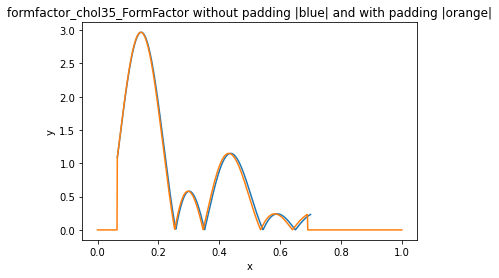

13



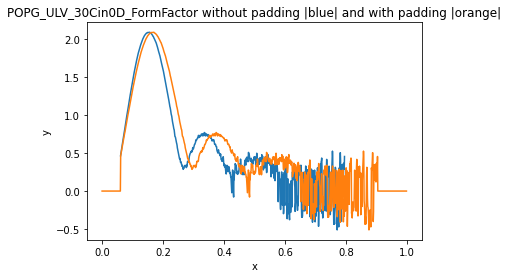

14



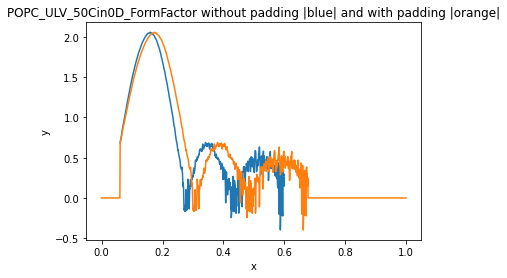

15



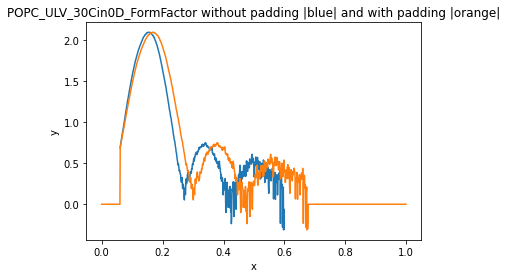

16



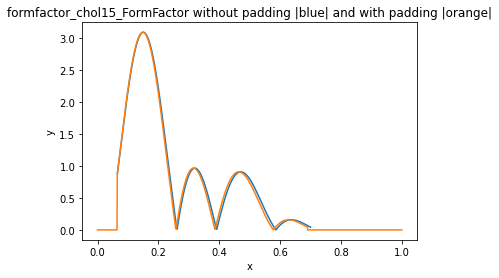

17



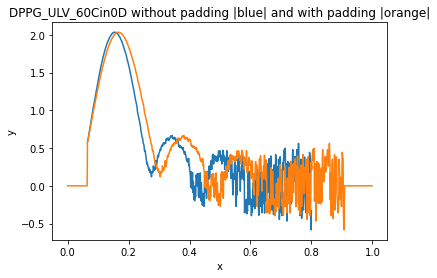

18



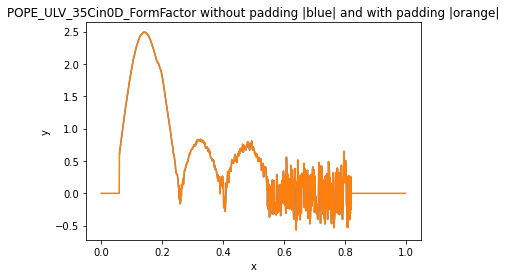

19



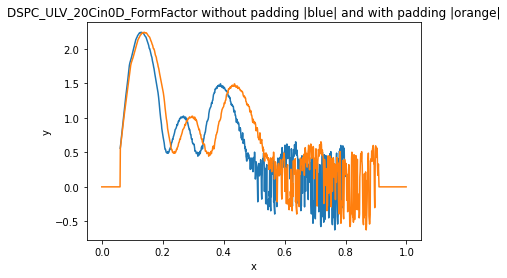

20



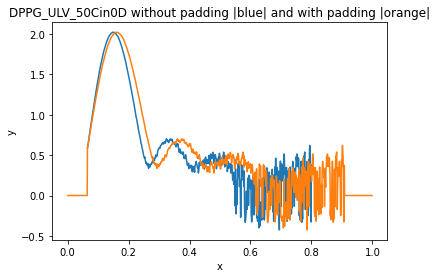

21



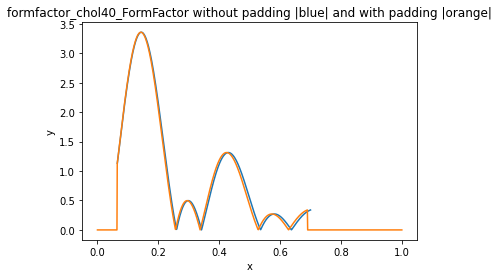

22



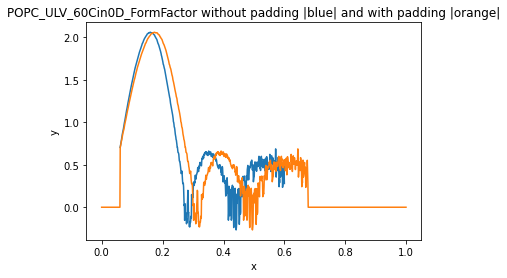

23



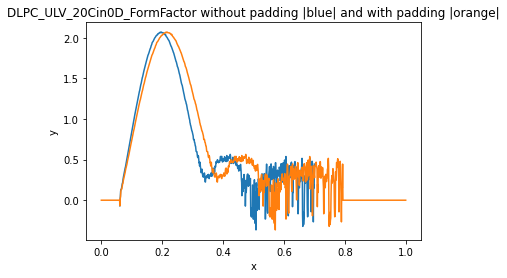

24



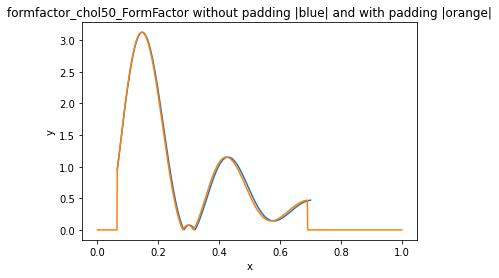

25



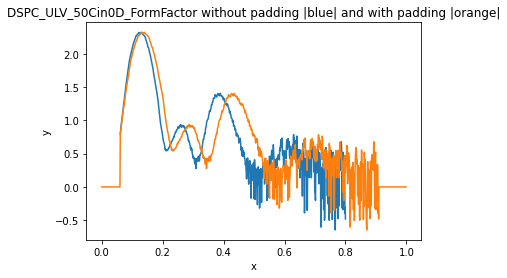

26



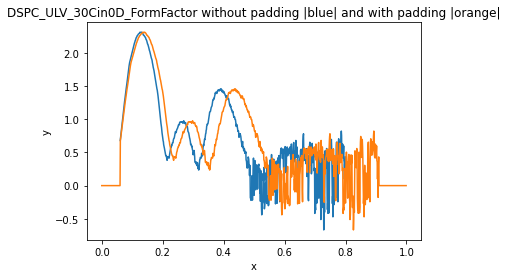

27



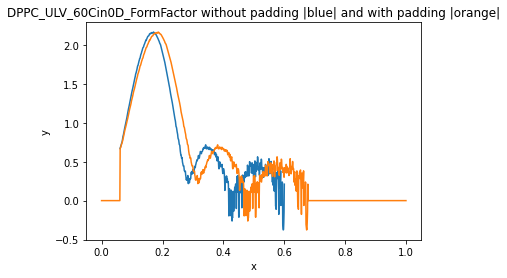

28



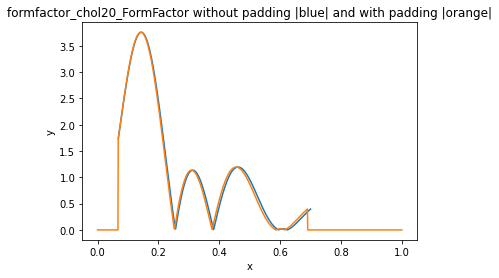

29



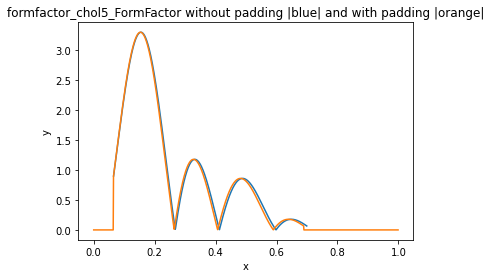

30



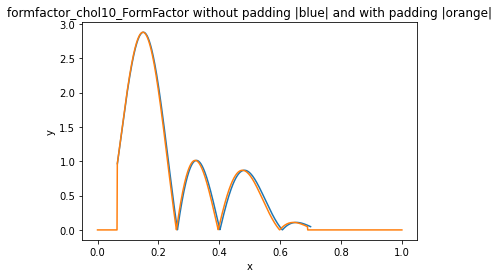

31



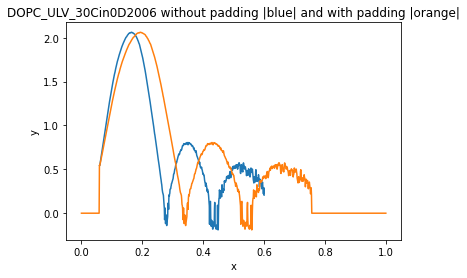

32



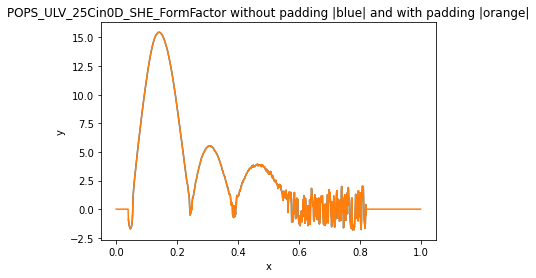

33



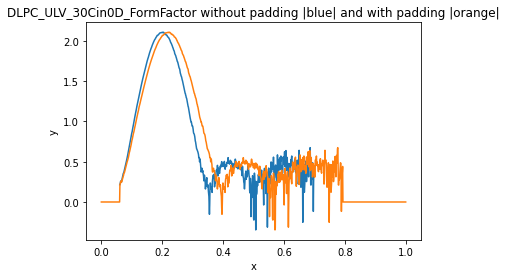

34



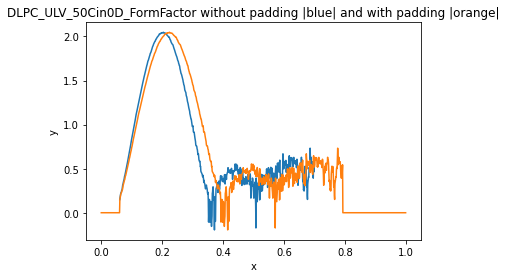

35



In [55]:
index = 0
for column in exp_FF.columns:
    plt.plot(exp_FF.iloc[0,index],exp_FF.iloc[1,index])
    plt.plot(np.arange(0,1,0.001),exp_FF_df[index])
    plt.title(column + ' without padding |blue| and with padding |orange|')
    plt.xlabel('x')
    plt.ylabel('y')
    plt.show()
    print(index)
    print('')
    index = index + 1

(490, 1000)
(490, 400)
(123, 1000)
(123, 400)
(36, 1000)


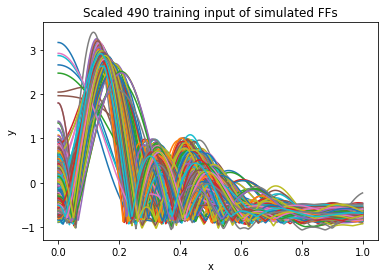

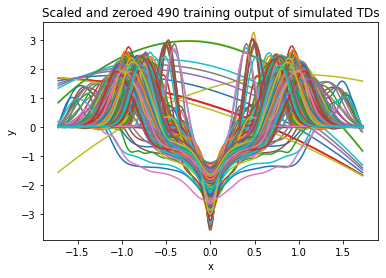

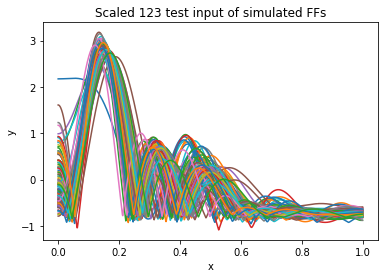

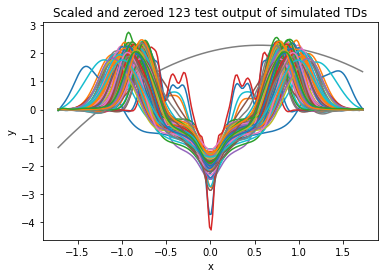

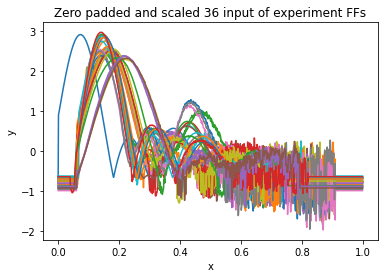

In [5]:
def data_plots(train_input, train_output, test_input, test_output, exp_input): 
    train_sim_FF_df = pd.DataFrame(train_input)
    for row in train_sim_FF_df.iloc:
        plt.plot(np.arange(0,1,0.001),row)
    plt.xlabel('x')
    plt.ylabel('y')
    plt.title('Scaled ' + str(train_sim_FF_df.shape[0]) + ' training input of simulated FFs')
    plt.show()
    
    train_sim_TD_df = pd.DataFrame(train_output)
    for row in train_sim_TD_df.iloc:
        plt.plot(row[:200],row[200:])
    plt.xlabel('x')
    plt.ylabel('y')
    plt.title('Scaled and zeroed ' + str(train_sim_TD_df.shape[0]) + ' training output of simulated TDs')
    plt.show()
    
    test_sim_FF_df = pd.DataFrame(test_input)
    for row in test_sim_FF_df.iloc:
        plt.plot(np.arange(0,1,0.001),row)
    plt.xlabel('x')
    plt.ylabel('y')
    plt.title('Scaled ' + str(test_sim_FF_df.shape[0]) + ' test input of simulated FFs')
    plt.show()
    
    test_sim_TD_df = pd.DataFrame(test_output)
    for row in test_sim_TD_df.iloc:
        plt.plot(row[:200],row[200:])
    plt.xlabel('x')
    plt.ylabel('y')
    plt.title('Scaled and zeroed ' + str(test_sim_TD_df.shape[0]) + ' test output of simulated TDs')
    plt.show()
    
    exp_FF_df = pd.DataFrame(exp_input)
    for row in exp_FF_df.iloc:
        plt.plot(np.arange(0,1,0.001),row)
    plt.xlabel('x')
    plt.ylabel('y')
    plt.title('Zero padded and scaled ' + str(exp_FF_df.shape[0]) + ' input of experiment FFs')
    plt.show()

def reduced_FF_to_TD_preprocessing(exp_FF_df, sim_FF_df, sim_TD_x_df, sim_TD_y_df):
    random.seed(42)
    train = random.sample(list(sim_FF_df.columns),int(round(613*0.8,0)))
    test = []
    for number in list(sim_FF_df.columns):
        if not number in train:
            test.append(number)
    
    exp_FF_scaled_values = []
    for column in exp_FF_df.columns:
        exp_FF_scaled_values.append((exp_FF_df[column] - exp_FF_df[column].mean()) / exp_FF_df[column].std())
    
    exp_FF_scaled_df = pd.DataFrame(exp_FF_scaled_values)
    exp_FF_scaled_df = exp_FF_scaled_df.transpose()
    exp_FF_scaled_df.columns = exp_FF_df.columns
             
    FF_scaled_values = []
    for column in sim_FF_df.columns:
        FF_scaled_values.append((sim_FF_df[column] - sim_FF_df[column].mean()) / sim_FF_df[column].std())
    
    sim_FF_scaled_df = pd.DataFrame(FF_scaled_values)
    sim_FF_scaled_df = sim_FF_scaled_df.transpose()
    sim_FF_scaled_df.columns = sim_FF_df.columns
            
    sim_TD_x_df = sim_TD_x_df
    TD_x_scaled_values = []
    for column in sim_TD_x_df.columns:
        TD_x_scaled_values.append((sim_TD_x_df[column] - sim_TD_x_df[column].mean()) / sim_TD_x_df[column].std())
        
    TD_x_scaled_df = pd.DataFrame(TD_x_scaled_values)
    TD_x_scaled_df = TD_x_scaled_df.transpose()
    TD_x_scaled_df.columns = sim_TD_x_df.columns
    
    TD_y_scaled_values = []
    for column in sim_TD_y_df.columns:
        TD_y_scaled_values.append((sim_TD_y_df[column] - sim_TD_y_df[column].mean()) / sim_TD_y_df[column].std())
    
    TD_y_scaled_df = pd.DataFrame(TD_y_scaled_values)
    TD_y_scaled_df = TD_y_scaled_df.transpose()
    TD_y_scaled_df.columns = sim_TD_y_df.columns
    
    zeroing = round((TD_y_scaled_df.iloc[0]+TD_y_scaled_df.iloc[-1])/2,3)
    TD_y_scaled_df = TD_y_scaled_df.subtract(zeroing)
             
    sim_TD_df = pd.concat([TD_x_scaled_df, TD_y_scaled_df], axis=0)
    train_input = sim_FF_scaled_df[train].transpose().astype(np.float32)
    train_output = sim_TD_df[train].transpose().values.astype(np.float32)
    test_input = sim_FF_scaled_df[test].transpose().astype(np.float32)
    test_output = sim_TD_df[test].transpose().values.astype(np.float32)
    exp_input = exp_FF_scaled_df.transpose().values.astype(np.float32)
            
    print(train_input.shape)
    print(train_output.shape)
    print(test_input.shape)
    print(test_output.shape)
    print(exp_input.shape)
     
    return train_input, train_output, test_input, test_output, exp_input 

train_input, train_output, test_input, test_output, exp_input = reduced_FF_to_TD_preprocessing(exp_FF_df, sim_FF_df, sim_TD_x_df, sim_TD_y_df)
data_plots(train_input, train_output, test_input, test_output, exp_input)

In [6]:
def single_average_loss(actual,prediction):
    length = int(actual.shape[0]/2)
    
    t_x = actual[0:length]
    t_y = actual[length:]
    p_x = prediction[0:length]
    p_y = prediction[length:]
    
    distance_sum = 0
    for i in range(0,length):
        distance_sum = distance_sum + math.sqrt((t_x[i]-p_x[i])**2 + (t_y[i]-p_y[i])**2)

    return (distance_sum/length)

def metrics(actual,prediction):
    amount = int(actual.shape[0])
    length = int(actual.shape[1]/2)
    
    index = 0
    loss_list = []
    for data in prediction:
        p_x = data[0:length]
        p_y = data[length:]
        t_x = actual[index][0:length]
        t_y = actual[index][length:]
         
        distance_sum = 0
        for i in range(0,length):
            distance_sum = distance_sum + math.sqrt((t_x[i]-p_x[i])**2 + (t_y[i]-p_y[i])**2)
            
        loss_list.append(distance_sum/length)
        index = index + 1
     
    average_loss = sum(loss_list)/amount
    mode_loss = Counter(np.round(loss_list,5)).most_common(10)
    median_loss = st.median(np.round(loss_list,5))
    
    plt.hist(np.round(loss_list,5), bins = amount)
    plt.xlabel('Loss')
    plt.ylabel('Amount')
    plt.title('Loss frequency for test data of ' + str(amount))
    plt.show()
    
    return [average_loss, mode_loss, median_loss]

def simulation_plots(actual,prediction):
    random.seed(42)
    train = random.sample(range(0,len(actual)),10)
    for number in train:
        length = int(len(prediction[0])/2)
        x_1 = prediction[number][0:length]
        y_1 = prediction[number][length:]
        plt.plot(x_1,y_1,c='b')

        x_2 = actual[number][0:length]
        y_2 = actual[number][length:]
        plt.plot(x_2,y_2,c='r')

    plt.xlabel('x')
    plt.ylabel('y')
    plt.title('Output curve of the ten random predictions |blue| against actual |red|')
    plt.show() 
    
    index = 0
    for points in prediction:
        p_x = points[0:length]
        p_y = points[length:]
        plt.scatter(p_x,p_y,c='b', label='Prediction', alpha=0.25)
        t_x = actual[index][0:length].tolist()
        t_y = actual[index][length:].tolist()
        plt.scatter(t_x,t_y,c='r', label = 'Actual', alpha=0.50)
        index = index + 1

    plt.xlabel('x')
    plt.ylabel('y')
    plt.title('Output scatterplot of prediction |blue| and actual |red| data')
    plt.show()
    
    length = int(len(prediction[0])/2)
    x_1 = prediction[train[0]][0:length]
    y_1 = prediction[train[0]][length:]
    plt.plot(x_1,y_1,c='b')

    x_2 = actual[train[0]][0:length]
    y_2 = actual[train[0]][length:]
    
    plt.plot(x_2,y_2,c='r')
    plt.xlabel('x')
    plt.ylabel('y')
    plt.title('Curve of index ' + str(train[0]) + ' with predictions |blue| against actual |red|')
    plt.show() 
    print('The loss of the curve ' + str(single_average_loss(actual[train[0]],prediction[train[0]])))
    
    length = int(len(prediction[0])/2)
    x_1 = prediction[train[4]][0:length]
    y_1 = prediction[train[4]][length:]
    plt.plot(x_1,y_1,c='b')

    x_2 = actual[train[4]][0:length]
    y_2 = actual[train[4]][length:]
    
    plt.plot(x_2,y_2,c='r')
    plt.xlabel('x')
    plt.ylabel('y')
    plt.title('Curve of index ' + str(train[4]) + ' with predictions |blue| against actual |red|')
    plt.show() 
    print('The loss of the curve ' + str(single_average_loss(actual[train[4]],prediction[train[4]])))
    
    length = int(len(prediction[0])/2)
    x_1 = prediction[train[9]][0:length]
    y_1 = prediction[train[9]][length:]
    plt.plot(x_1,y_1,c='b')

    x_2 = actual[train[9]][0:length]
    y_2 = actual[train[9]][length:]
    
    plt.plot(x_2,y_2,c='r')
    plt.xlabel('x')
    plt.ylabel('y')
    plt.title('Curve of index ' + str(train[9]) + ' with predictions |blue| against actual |red|')
    plt.show() 
    print('The loss of the curve ' + str(single_average_loss(actual[train[9]],prediction[train[9]])))
    
def experiment_predictions(exp_input,prediction):
    random.seed(42)
    train = random.sample(range(0,len(prediction)),10)
    length = int(len(prediction[0])/2)
    for number in train:
        plt.subplot(1,2,1)
        plt.plot(np.arange(0,1,0.001), exp_input[number])
        plt.subplot(1,2,2)
        plt.plot(prediction[number][0:length],prediction[number][length:])
        plt.suptitle('TD prediction for experiment FF index ' + str(number))
        plt.show()
        
    index = 0
    for points in prediction:
        p_x = points[0:length]
        p_y = points[length:]
        plt.scatter(p_x,p_y,c='b')
        index = index + 1

    plt.xlabel('x')
    plt.ylabel('y')
    plt.title('Output scatterplot of prediction on experiment data')
    plt.show()

Used time: 125.69674515724182 seconds


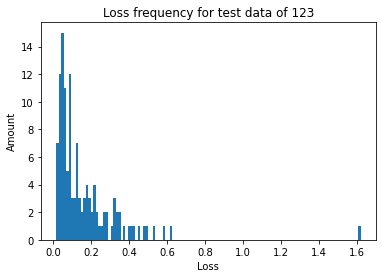

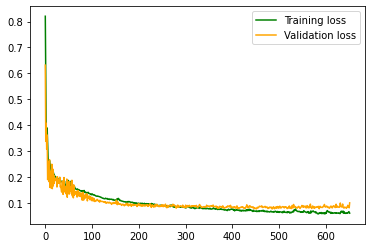

Loss average is: 0.1602680829147837
Loss mode is: [(0.26639, 1), (0.62214, 1), (0.1037, 1), (0.18286, 1), (0.41501, 1), (0.05759, 1), (0.05767, 1), (1.62086, 1), (0.12671, 1), (0.07766, 1)]
Loss median is: 0.0914


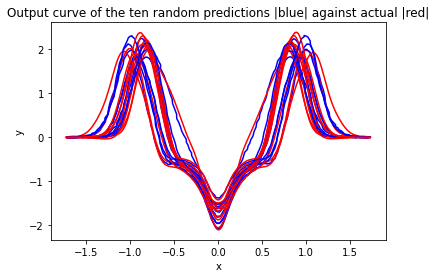

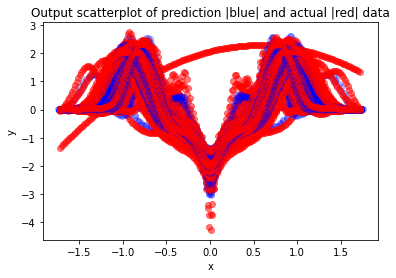

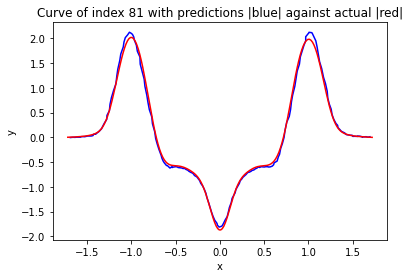

The loss of the curve 0.08387129663113611


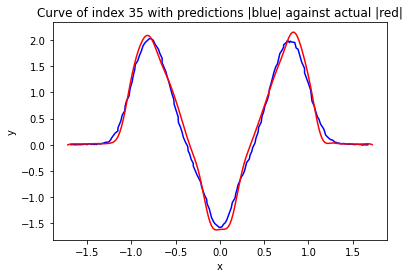

The loss of the curve 0.11996930959370582


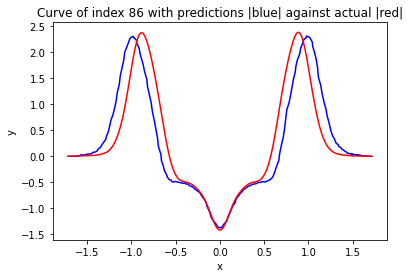

The loss of the curve 0.34742694863704343


In [58]:
general_start_time = time.time()

callbacks = [EarlyStopping(monitor='val_loss', 
                       mode='min', 
                       patience=200, 
                       restore_best_weights=True)]

inputs = keras.Input(shape=(1000,))
x = layers.Dense(3000, activation='relu')(inputs)
x = layers.Dropout(0.05, seed = 42)(x)
x = layers.Dense(2000, activation='relu')(x)
x = layers.Dropout(0.1, seed = 42)(x)
x = layers.Dense(500, activation='relu')(x)
x = layers.Dropout(0.25, seed = 42)(x)
x = layers.Dense(2000, activation='relu')(x)
x = layers.Dropout(0.15, seed = 42)(x)
outputs = layers.Dense(400, activation='linear')(x)
model = keras.Model(inputs=inputs, outputs=outputs)
model.compile(optimizer=Adam(amsgrad=True, learning_rate=1e-3), loss='mean_absolute_error')

history = model.fit(train_input, train_output, batch_size=300, epochs=1500, validation_split=0.2, callbacks=callbacks, verbose=0)

general_end_time = time.time()

print('Used time: ' + str(general_end_time - general_start_time) + ' seconds')

results = metrics(test_output, model.predict(test_input))

plt.plot(history.history['loss'], color = 'green', label = 'Training loss')
plt.plot(history.history['val_loss'], color = 'orange', label = 'Validation loss')
plt.legend()
plt.show()

print('Loss average is: ' + str(results[0]))
print('Loss mode is: ' + str(results[1]))
print('Loss median is: ' + str(results[2]))
simulation_plots(test_output,model.predict(test_input))
experiment_predictions(exp_input,model.predict(exp_input))

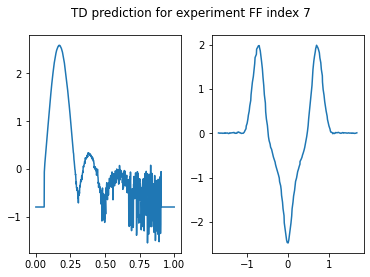

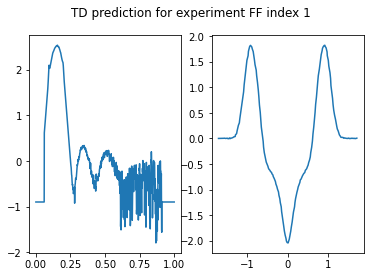

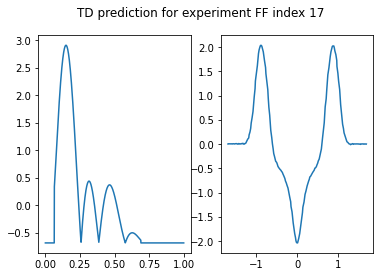

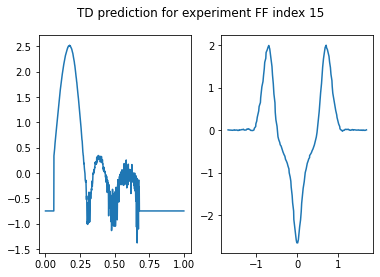

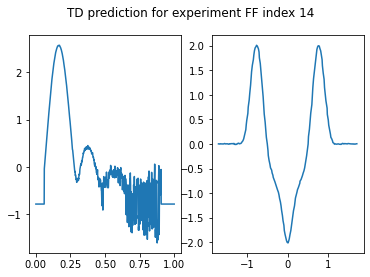

...

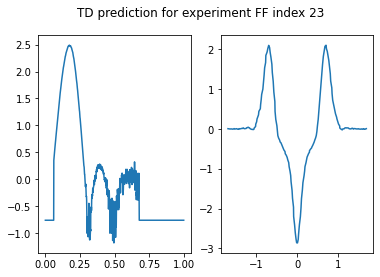

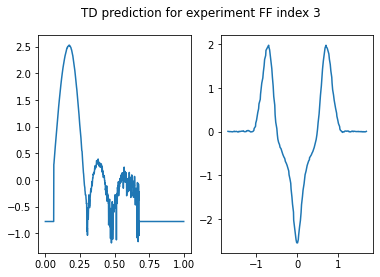

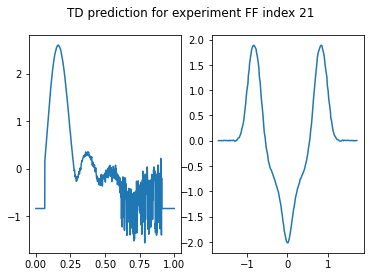

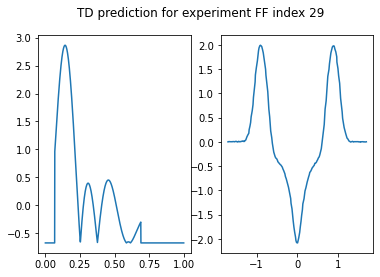

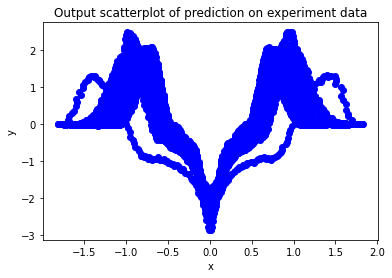

In [69]:
experiment_predictions(exp_input,model.predict(exp_input))

Used time: 138.65096926689148 seconds


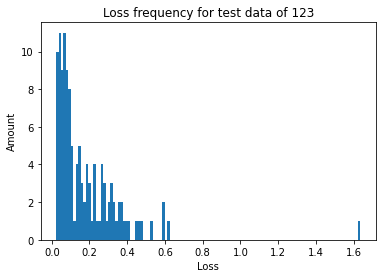

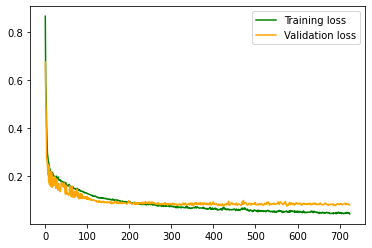

Loss average is: 0.17846811463821013
Loss mode is: [(0.23767, 1), (0.59856, 1), (0.17005, 1), (0.22725, 1), (0.46856, 1), (0.06963, 1), (0.34404, 1), (1.63629, 1), (0.22375, 1), (0.08007, 1)]
Loss median is: 0.10861


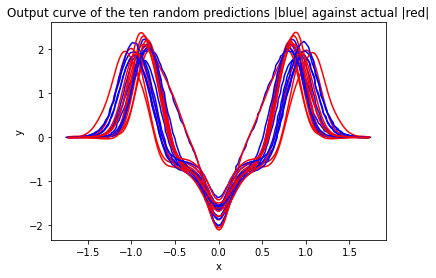

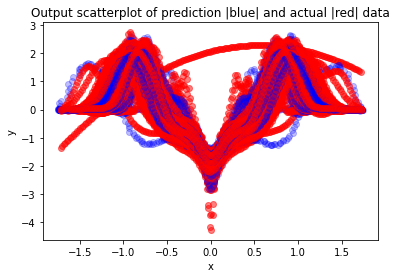

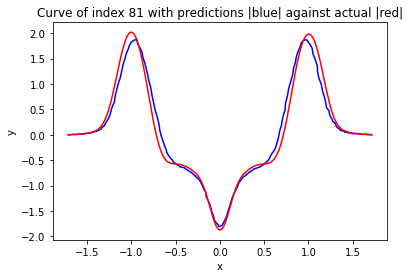

The loss of the curve 0.1106889518974397


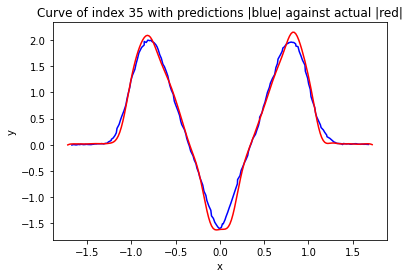

The loss of the curve 0.10163610927767554


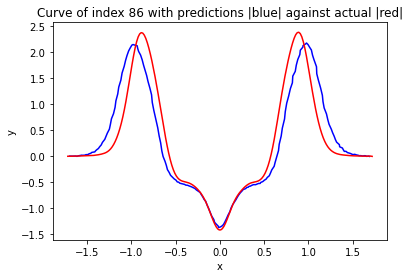

The loss of the curve 0.31199707124237563


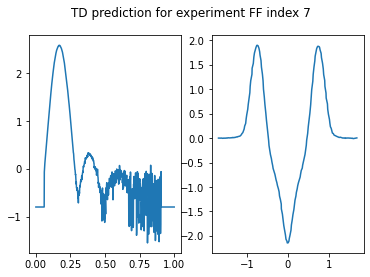

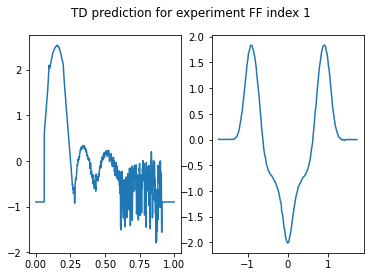

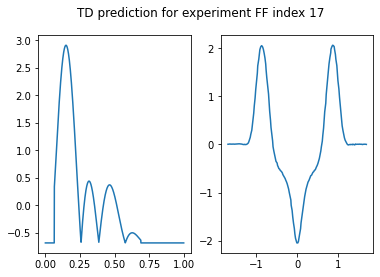

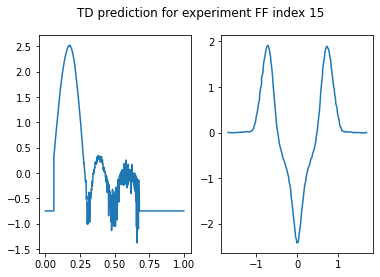

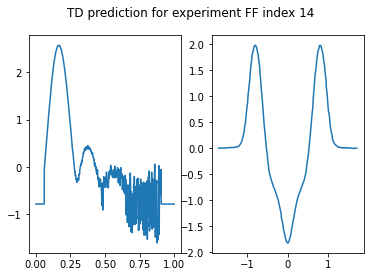

...

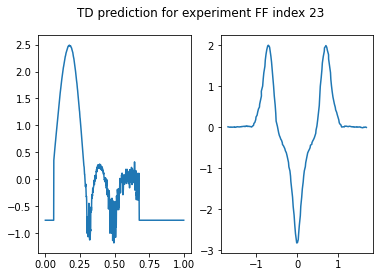

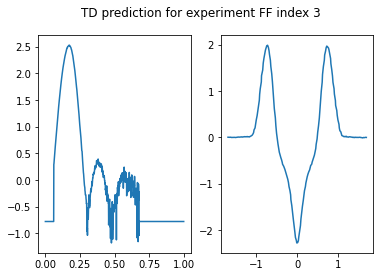

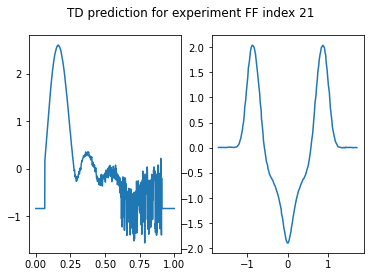

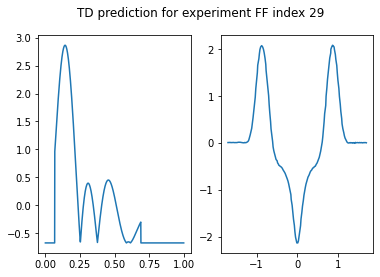

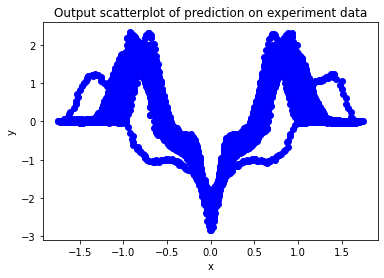

In [70]:
general_start_time = time.time()

callbacks = [EarlyStopping(monitor='val_loss', 
                       mode='min', 
                       patience=300, 
                       restore_best_weights=True)]

inputs = keras.Input(shape=(1000,))
x = layers.Dense(3000, activation='relu')(inputs)
x = layers.Dropout(0.05, seed = 42)(x)
x = layers.Dense(2000, activation='relu')(x)
x = layers.Dropout(0.1, seed = 42)(x)
x = layers.Dense(500, activation='relu')(x)
x = layers.Dropout(0.25, seed = 42)(x)
x = layers.Dense(2000, activation='relu')(x)
x = layers.Dropout(0.15, seed = 42)(x)
outputs = layers.Dense(400, activation='linear')(x)
model = keras.Model(inputs=inputs, outputs=outputs)
model.compile(optimizer=Adam(amsgrad=True), loss='mean_absolute_error')

history = model.fit(train_input, train_output, batch_size=200, epochs=1500, validation_split=0.2, callbacks=callbacks, verbose=0)

general_end_time = time.time()

print('Used time: ' + str(general_end_time - general_start_time) + ' seconds')

results = metrics(test_output, model.predict(test_input))

plt.plot(history.history['loss'], color = 'green', label = 'Training loss')
plt.plot(history.history['val_loss'], color = 'orange', label = 'Validation loss')
plt.legend()
plt.show()

print('Loss average is: ' + str(results[0]))
print('Loss mode is: ' + str(results[1]))
print('Loss median is: ' + str(results[2]))
simulation_plots(test_output,model.predict(test_input))
experiment_predictions(exp_input,model.predict(exp_input))

Used time: 169.39281058311462 seconds


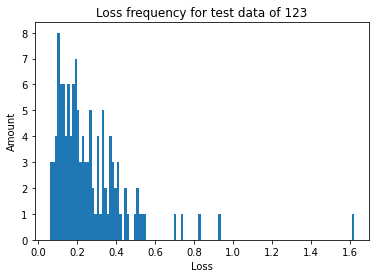

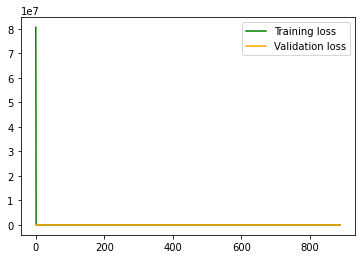

Loss average is: 0.26554774665133135
Loss mode is: [(0.22144, 1), (0.50978, 1), (0.44259, 1), (0.50648, 1), (0.41269, 1), (0.07593, 1), (0.18155, 1), (1.62299, 1), (0.22387, 1), (0.21504, 1)]
Loss median is: 0.20968


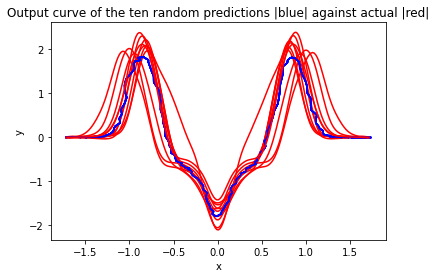

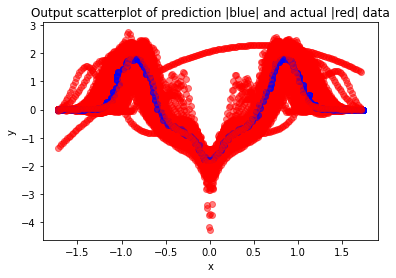

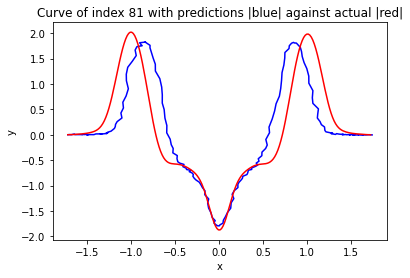

The loss of the curve 0.38268899554040076


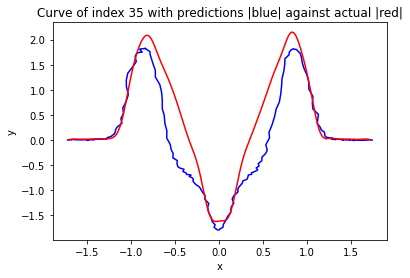

The loss of the curve 0.3131915091023728


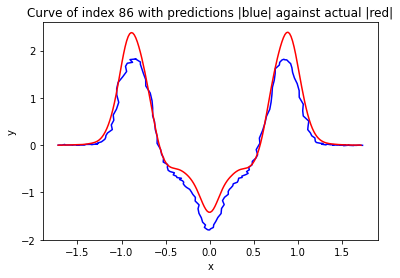

The loss of the curve 0.1855499823044801


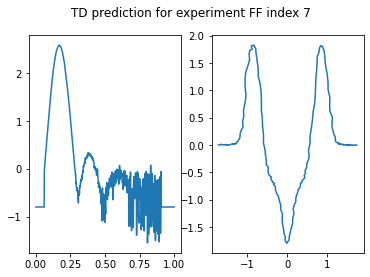

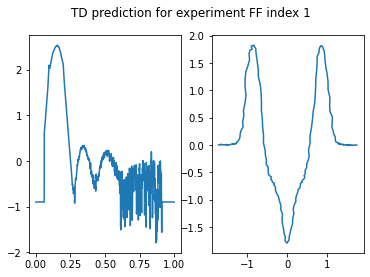

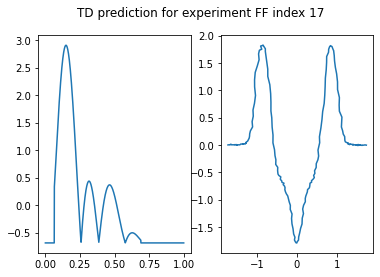

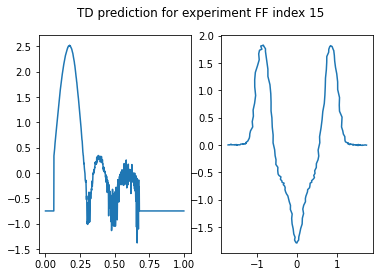

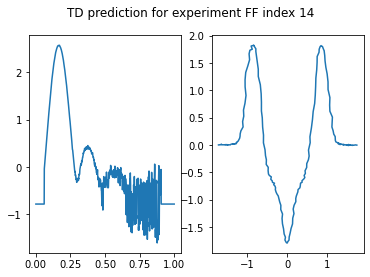

...

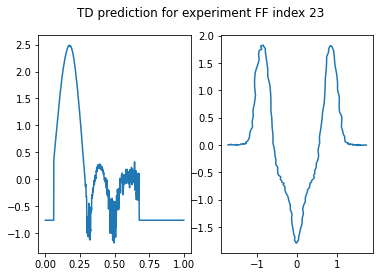

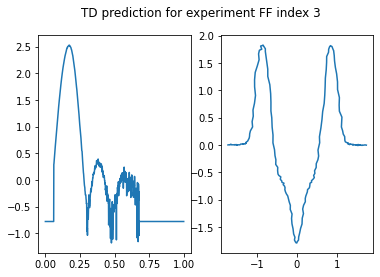

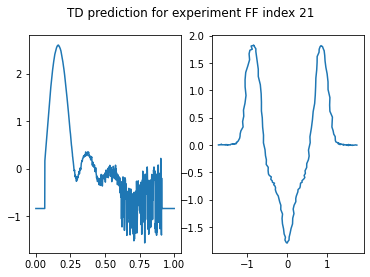

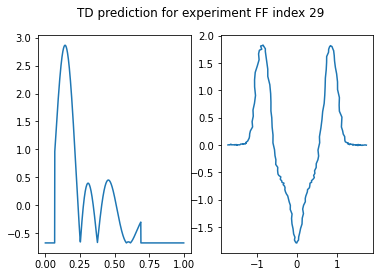

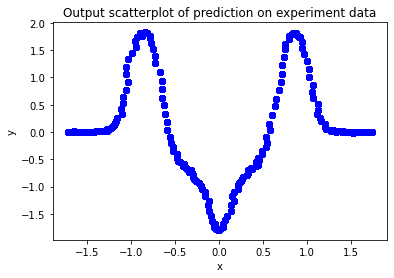

In [71]:
general_start_time = time.time()

callbacks = [EarlyStopping(monitor='val_loss', 
                       mode='min', 
                       patience=300, 
                       restore_best_weights=True)]

inputs = keras.Input(shape=(1000,))
x = layers.Dense(3000, activation='relu')(inputs)
x = layers.Dropout(0.05, seed = 42)(x)
x = layers.Dense(2000, activation='relu')(x)
x = layers.Dropout(0.1, seed = 42)(x)
x = layers.Dense(500, activation='relu')(x)
x = layers.Dropout(0.25, seed = 42)(x)
x = layers.Dense(2000, activation='relu')(x)
x = layers.Dropout(0.15, seed = 42)(x)
outputs = layers.Dense(400, activation='linear')(x)
model = keras.Model(inputs=inputs, outputs=outputs)
model.compile(optimizer=Adam(amsgrad=True, learning_rate=1e-1), loss='mean_absolute_error')

history = model.fit(train_input, train_output, batch_size=200, epochs=1500, validation_split=0.2, callbacks=callbacks, verbose=0)

general_end_time = time.time()

print('Used time: ' + str(general_end_time - general_start_time) + ' seconds')

results = metrics(test_output, model.predict(test_input))

plt.plot(history.history['loss'], color = 'green', label = 'Training loss')
plt.plot(history.history['val_loss'], color = 'orange', label = 'Validation loss')
plt.legend()
plt.show()

print('Loss average is: ' + str(results[0]))
print('Loss mode is: ' + str(results[1]))
print('Loss median is: ' + str(results[2]))
simulation_plots(test_output,model.predict(test_input))
experiment_predictions(exp_input,model.predict(exp_input))

Used time: 283.75223422050476 seconds


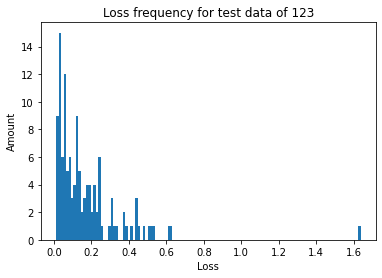

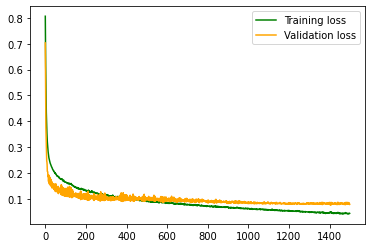

Loss average is: 0.16915828255314044
Loss mode is: [(0.05642, 2), (0.11539, 1), (0.44659, 1), (0.09773, 1), (0.18485, 1), (0.50636, 1), (0.17717, 1), (1.63704, 1), (0.14062, 1), (0.1041, 1)]
Loss median is: 0.11853


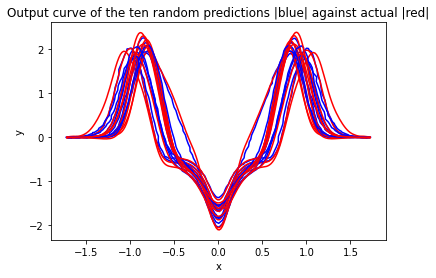

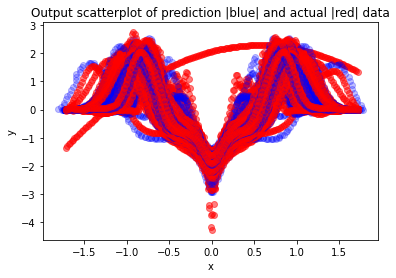

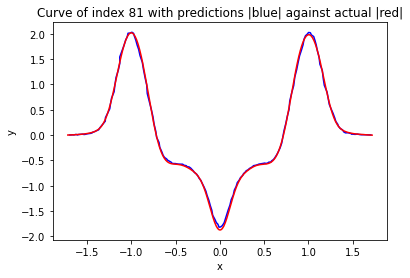

The loss of the curve 0.04400039524668118


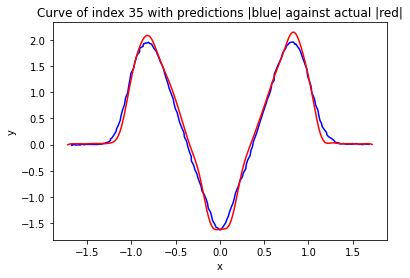

The loss of the curve 0.11187418383988805


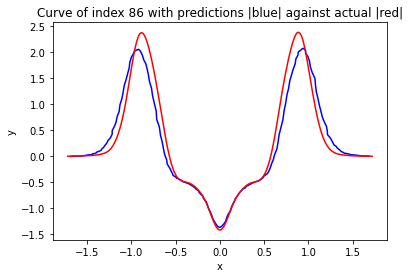

The loss of the curve 0.22060034049351981


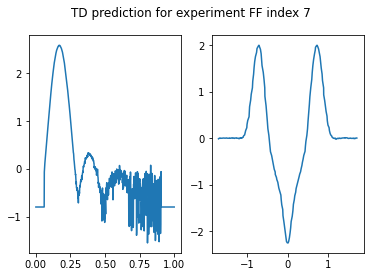

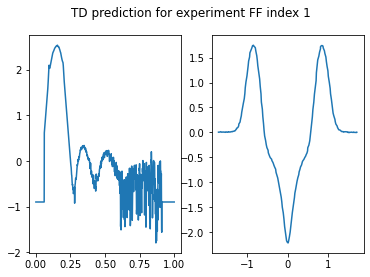

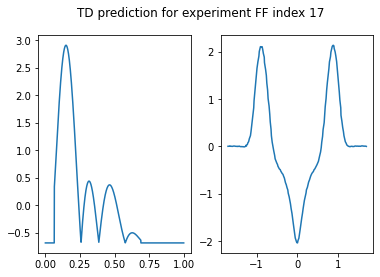

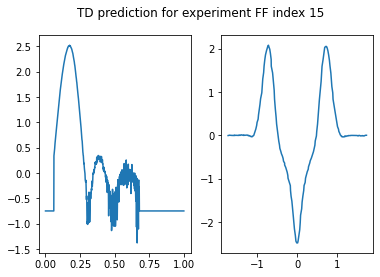

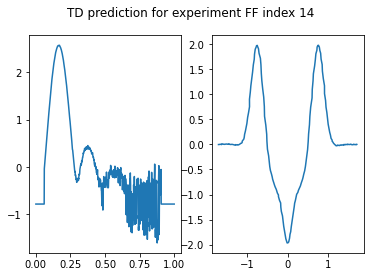

...

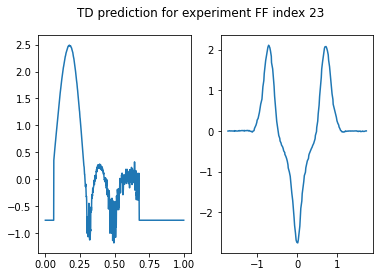

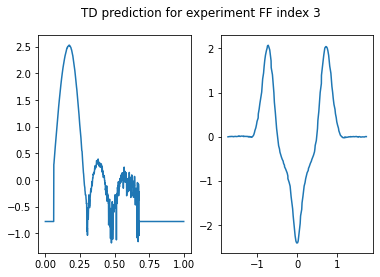

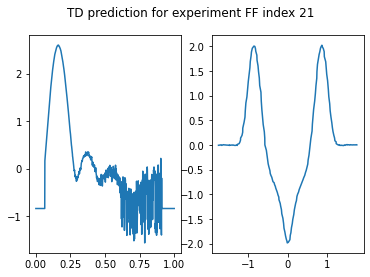

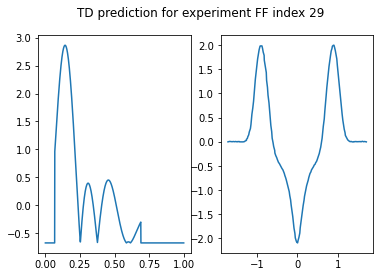

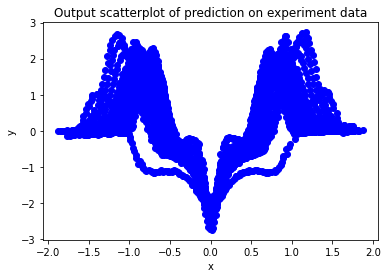

In [72]:
general_start_time = time.time()

callbacks = [EarlyStopping(monitor='val_loss', 
                       mode='min', 
                       patience=300, 
                       restore_best_weights=True)]

inputs = keras.Input(shape=(1000,))
x = layers.Dense(3000, activation='relu')(inputs)
x = layers.Dropout(0.05, seed = 42)(x)
x = layers.Dense(2000, activation='relu')(x)
x = layers.Dropout(0.1, seed = 42)(x)
x = layers.Dense(500, activation='relu')(x)
x = layers.Dropout(0.25, seed = 42)(x)
x = layers.Dense(2000, activation='relu')(x)
x = layers.Dropout(0.15, seed = 42)(x)
outputs = layers.Dense(400, activation='linear')(x)
model = keras.Model(inputs=inputs, outputs=outputs)
model.compile(optimizer=Adam(amsgrad=True, learning_rate=1e-4), loss='mean_absolute_error')

history = model.fit(train_input, train_output, batch_size=200, epochs=1500, validation_split=0.2, callbacks=callbacks, verbose=0)

general_end_time = time.time()

print('Used time: ' + str(general_end_time - general_start_time) + ' seconds')

results = metrics(test_output, model.predict(test_input))

plt.plot(history.history['loss'], color = 'green', label = 'Training loss')
plt.plot(history.history['val_loss'], color = 'orange', label = 'Validation loss')
plt.legend()
plt.show()

print('Loss average is: ' + str(results[0]))
print('Loss mode is: ' + str(results[1]))
print('Loss median is: ' + str(results[2]))
simulation_plots(test_output,model.predict(test_input))
experiment_predictions(exp_input,model.predict(exp_input))

Used time: 266.0081276893616 seconds


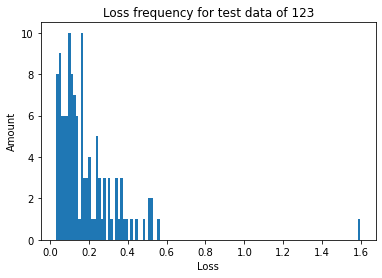

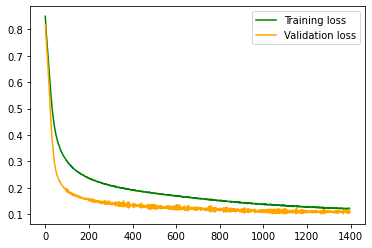

Loss average is: 0.18800911057642886
Loss mode is: [(0.19128, 1), (0.56074, 1), (0.35619, 1), (0.27716, 1), (0.36491, 1), (0.11406, 1), (0.05176, 1), (1.59703, 1), (0.1604, 1), (0.12017, 1)]
Loss median is: 0.1406


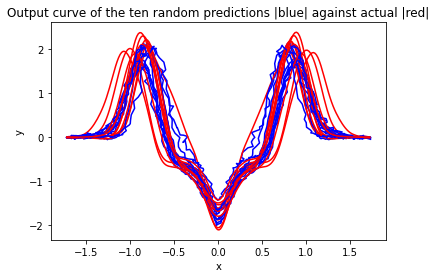

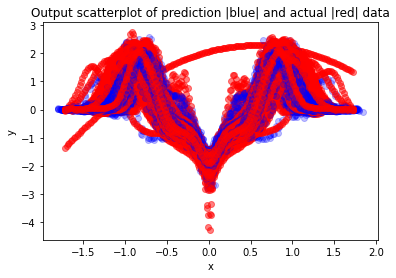

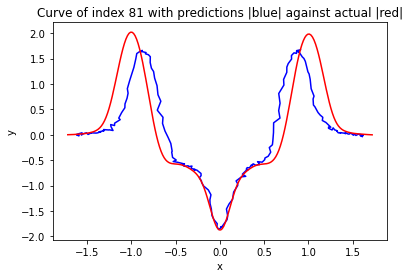

The loss of the curve 0.24519280973694996


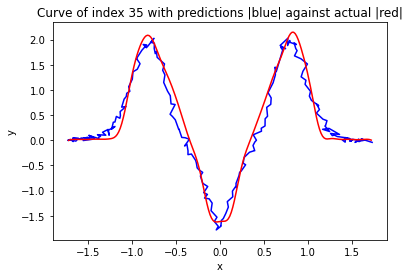

The loss of the curve 0.16556117476083115


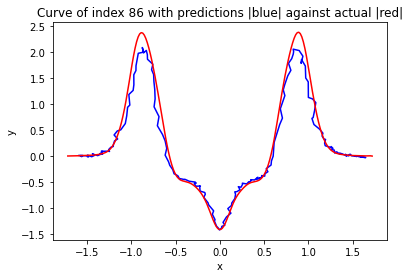

The loss of the curve 0.2319982424745543


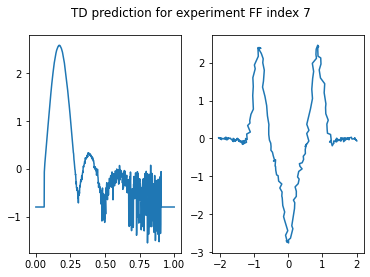

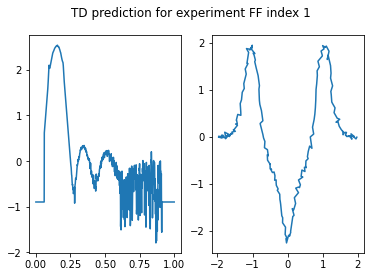

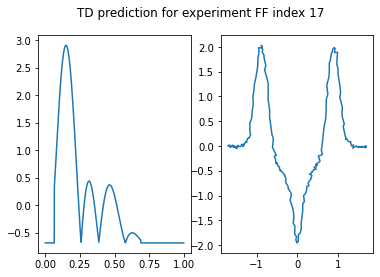

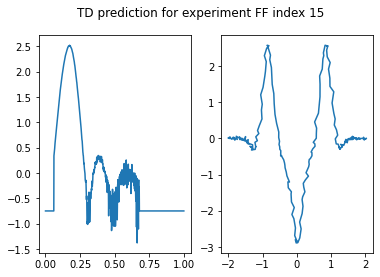

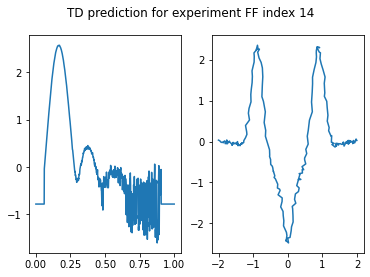

...

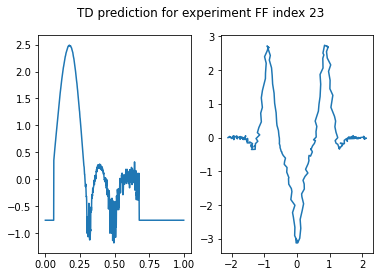

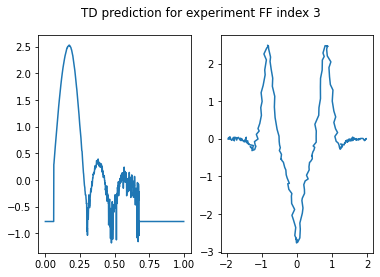

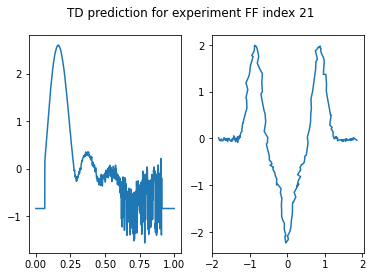

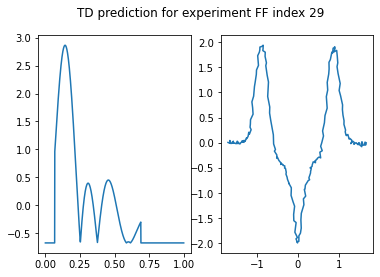

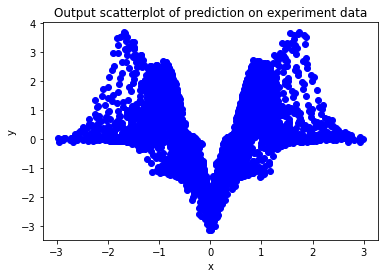

In [73]:
general_start_time = time.time()

callbacks = [EarlyStopping(monitor='val_loss', 
                       mode='min', 
                       patience=300, 
                       restore_best_weights=True)]

inputs = keras.Input(shape=(1000,))
x = layers.Dense(3000, activation='relu')(inputs)
x = layers.Dropout(0.05, seed = 42)(x)
x = layers.Dense(2000, activation='relu')(x)
x = layers.Dropout(0.1, seed = 42)(x)
x = layers.Dense(500, activation='relu')(x)
x = layers.Dropout(0.25, seed = 42)(x)
x = layers.Dense(2000, activation='relu')(x)
x = layers.Dropout(0.15, seed = 42)(x)
outputs = layers.Dense(400, activation='linear')(x)
model = keras.Model(inputs=inputs, outputs=outputs)
model.compile(optimizer=Adam(amsgrad=True, learning_rate=1e-5), loss='mean_absolute_error')

history = model.fit(train_input, train_output, batch_size=200, epochs=2000, validation_split=0.2, callbacks=callbacks, verbose=0)

general_end_time = time.time()

print('Used time: ' + str(general_end_time - general_start_time) + ' seconds')

results = metrics(test_output, model.predict(test_input))

plt.plot(history.history['loss'], color = 'green', label = 'Training loss')
plt.plot(history.history['val_loss'], color = 'orange', label = 'Validation loss')
plt.legend()
plt.show()

print('Loss average is: ' + str(results[0]))
print('Loss mode is: ' + str(results[1]))
print('Loss median is: ' + str(results[2]))
simulation_plots(test_output,model.predict(test_input))
experiment_predictions(exp_input,model.predict(exp_input))

Trial 90 Complete [00h 00m 16s]
loss: 0.13078425824642181

Best loss So Far: 0.11928671598434448
Total elapsed time: 00h 08m 59s
INFO:tensorflow:Oracle triggered exit
{'num_layers': 1, 'dense_0_units': 2000, 'dropout_0': 0.05, 'learning_rate': 0.001, 'dense_1_units': 3000, 'dropout_1': 0.25, 'dense_2_units': 2500, 'dropout_2': 0.1, 'dense_3_units': 500, 'dropout_3': 0.25, 'dense_4_units': 2000, 'dropout_4': 0.15000000000000002, 'tuner/epochs': 50, 'tuner/initial_epoch': 17, 'tuner/bracket': 2, 'tuner/round': 2, 'tuner/trial_id': '0067'}
Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 2000)              2002000   
_________________________________________________________________
dropout (Dropout)            (None, 2000)              0         
_________________________________________________________________
dense_1 (Dense)              (None, 400) 

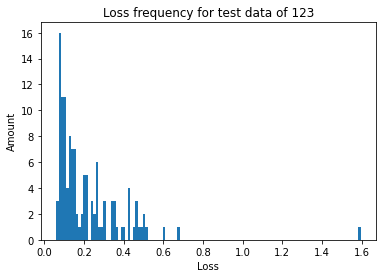

Loss average is: 0.21652382563925784
Loss mode is: [(0.13961, 2), (0.20138, 1), (0.60767, 1), (0.42804, 1), (0.39015, 1), (0.07854, 1), (0.12628, 1), (1.59498, 1), (0.25159, 1), (0.08497, 1)]
Loss median is: 0.15058


NameError: name 'model' is not defined

In [8]:
from keras.backend import sigmoid
from keras.utils.generic_utils import get_custom_objects
from keras.layers import Activation

def swish(x, beta = 1):
    return (x * sigmoid(beta * x))

get_custom_objects().update({'swish': Activation(swish)})

def build_model(hp):
    model = keras.Sequential()
    
    model.add(layers.Input(shape=(1000,)))
    
    for i in range(hp.Int('num_layers', 1, 5)):
        model.add(layers.Dense(units=hp.Int(f'dense_{i}_units', min_value=500, max_value=3000, step=500), 
                               activation='swish'))
        model.add(layers.Dropout(hp.Float(f'dropout_{i}', min_value=0.05, max_value=0.30, step=0.05), seed=42))
    
    model.add(layers.Dense(units=400, activation = 'linear'))
    
    model.compile(optimizer=Adam(amsgrad=True, learning_rate=hp.Choice('learning_rate', values=[1e-2, 1e-3, 1e-4])),loss='mean_absolute_error')
    
    return model

tuner = Hyperband(
    build_model,
    objective='loss',
    max_epochs=50,
    factor=3,
    directory='my_dir',
    project_name='FF_to_TD_11')

tuner.search(train_input, train_output,
             epochs=50,
             validation_data=(test_input, test_output))

best_model = tuner.get_best_models(num_models=1)[0]

best_hps = tuner.get_best_hyperparameters()[0]
print(best_hps.values)

two_best_models = tuner.get_best_models(num_models=1)
print(two_best_models[0].summary())

results = metrics(test_output, best_model.predict(test_input))
print('Loss average is: ' + str(results[0]))
print('Loss mode is: ' + str(results[1]))
print('Loss median is: ' + str(results[2]))
simulation_plots(test_output,best_model.predict(test_input))
experiment_predictions(best_model.predict(exp_input))

Used time: 241.17327427864075 seconds


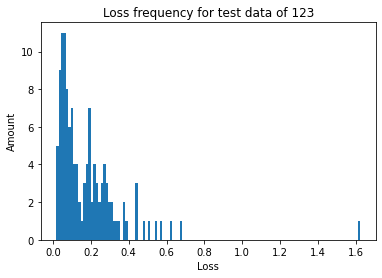

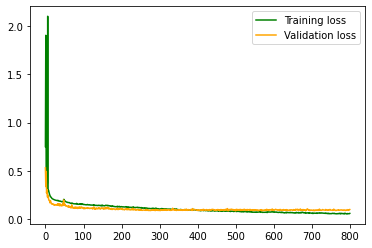

Loss average is: 0.181686026485331
Loss mode is: [(0.19506, 1), (0.6202, 1), (0.16749, 1), (0.15396, 1), (0.32557, 1), (0.05642, 1), (0.10699, 1), (1.62379, 1), (0.22449, 1), (0.10491, 1)]
Loss median is: 0.12161


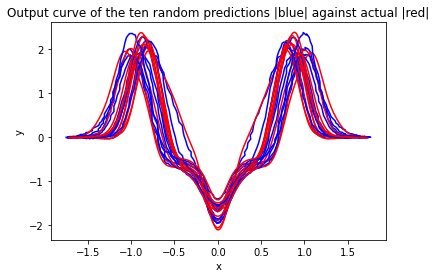

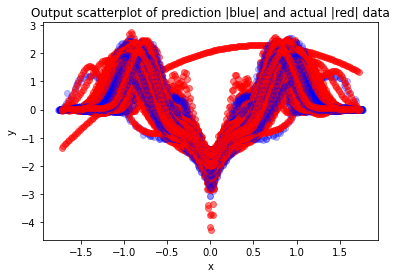

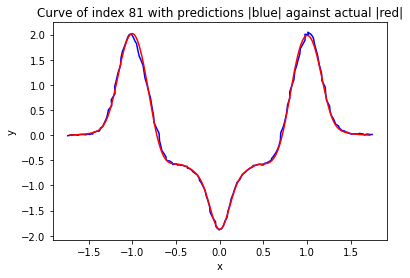

The loss of the curve 0.0396716431937602


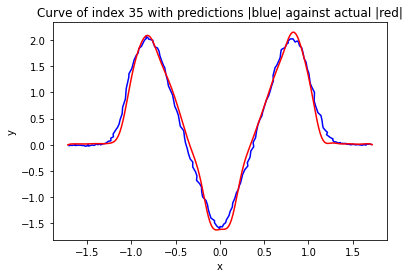

The loss of the curve 0.09969584261919434


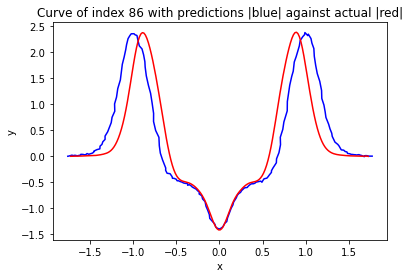

The loss of the curve 0.30298127276643144


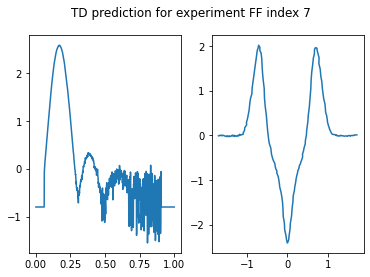

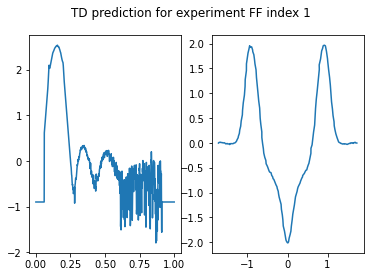

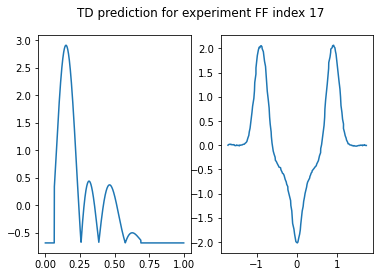

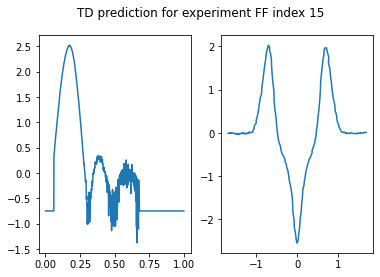

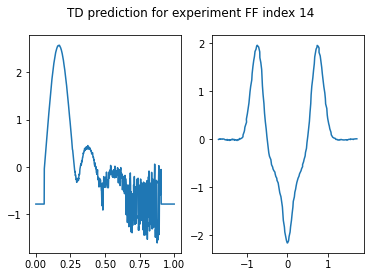

...

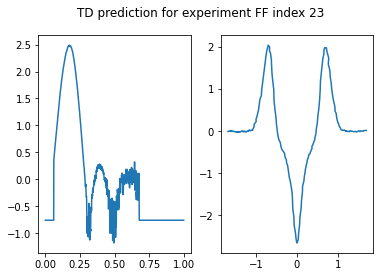

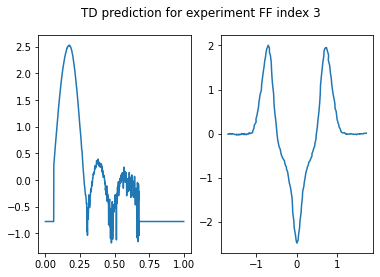

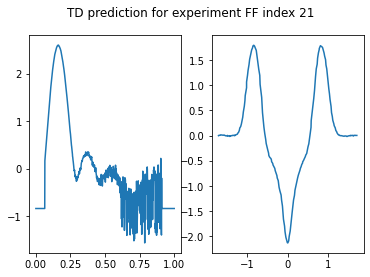

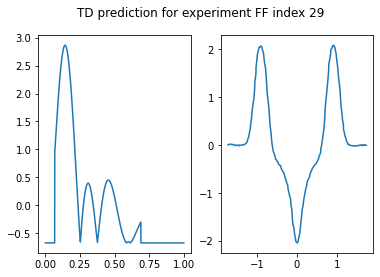

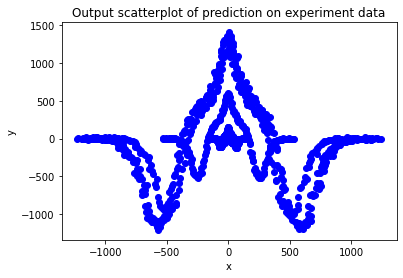

In [11]:
general_start_time = time.time()

callbacks = [EarlyStopping(monitor='val_loss', 
                       mode='min', 
                       patience=300, 
                       restore_best_weights=True)]

inputs = keras.Input(shape=(1000,))
x = layers.Dense(2000, activation='swish')(inputs)
x = layers.Dropout(0.05, seed = 42)(x)
x = layers.Dense(3000, activation='swish')(x)
x = layers.Dropout(0.25, seed = 42)(x)
x = layers.Dense(2500, activation='swish')(x)
x = layers.Dropout(0.1, seed = 42)(x)
x = layers.Dense(500, activation='swish')(x)
x = layers.Dropout(0.25, seed = 42)(x)
x = layers.Dense(2000, activation='swish')(x)
x = layers.Dropout(0.15, seed = 42)(x)
outputs = layers.Dense(400, activation='linear')(x)
model = keras.Model(inputs=inputs, outputs=outputs)
model.compile(optimizer=Adam(amsgrad=True, learning_rate=1e-3), loss='mean_absolute_error')

history = model.fit(train_input, train_output, batch_size=200, epochs=2000, validation_split=0.2, callbacks=callbacks, verbose=0)

general_end_time = time.time()

print('Used time: ' + str(general_end_time - general_start_time) + ' seconds')

results = metrics(test_output, model.predict(test_input))

plt.plot(history.history['loss'], color = 'green', label = 'Training loss')
plt.plot(history.history['val_loss'], color = 'orange', label = 'Validation loss')
plt.legend()
plt.show()

print('Loss average is: ' + str(results[0]))
print('Loss mode is: ' + str(results[1]))
print('Loss median is: ' + str(results[2]))
simulation_plots(test_output,model.predict(test_input))
experiment_predictions(exp_input,model.predict(exp_input))

Used time: 181.49055695533752 seconds


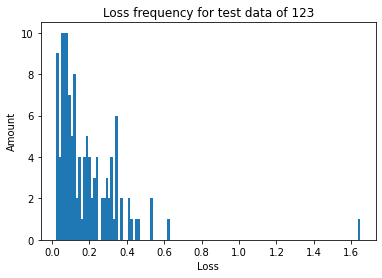

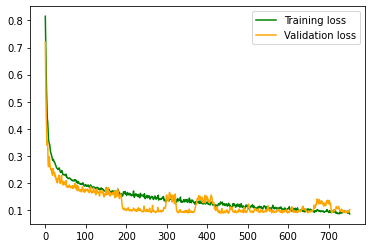

Loss average is: 0.18359583019539505
Loss mode is: [(0.20142, 1), (0.62012, 1), (0.24288, 1), (0.18174, 1), (0.27577, 1), (0.11398, 1), (0.05035, 1), (1.64932, 1), (0.23462, 1), (0.11698, 1)]
Loss median is: 0.12458


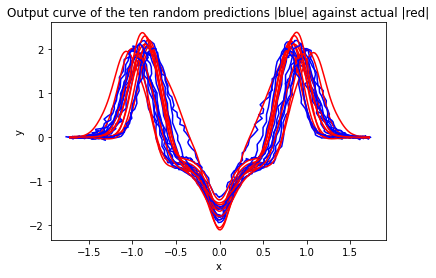

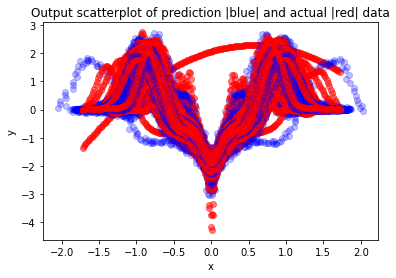

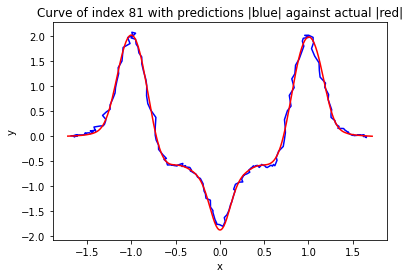

The loss of the curve 0.06395506442560396


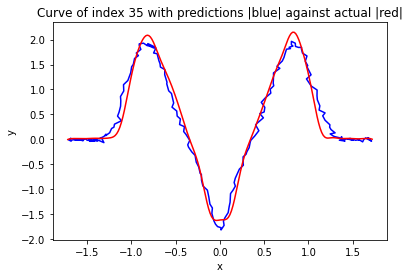

The loss of the curve 0.1432951953807862


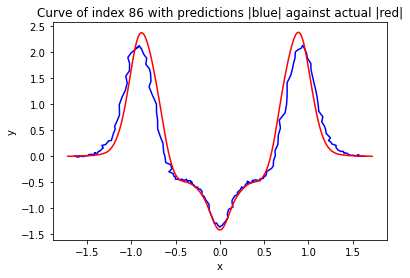

The loss of the curve 0.28889807862549555


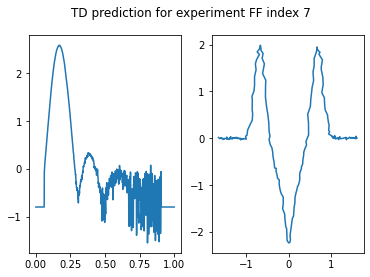

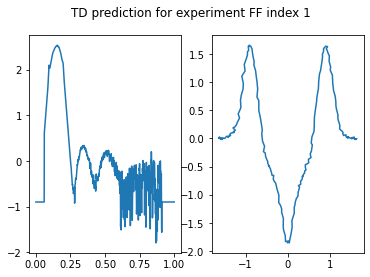

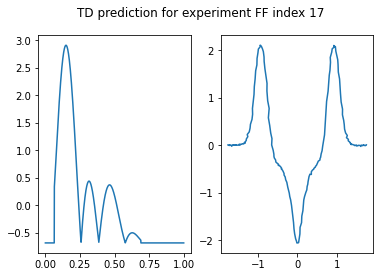

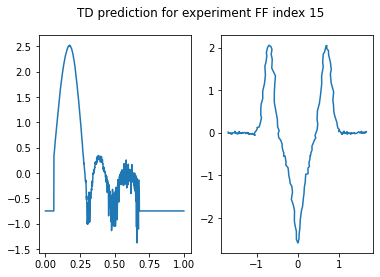

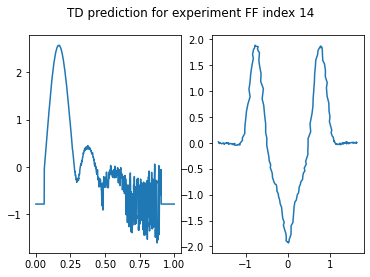

...

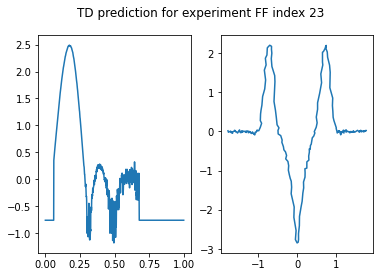

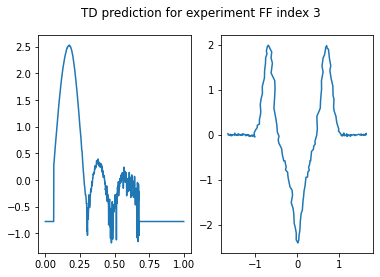

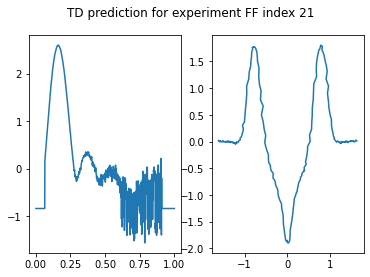

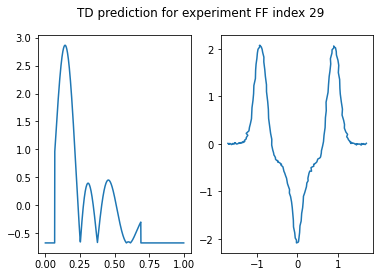

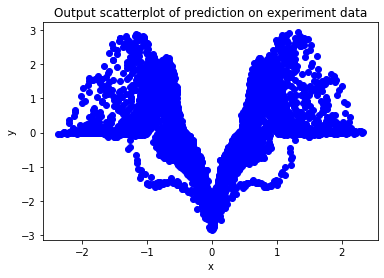

In [15]:
#from keras.optimizers import Nadam

general_start_time = time.time()

callbacks = [EarlyStopping(monitor='val_loss', 
                       mode='min', 
                       patience=300, 
                       restore_best_weights=True)]

inputs = keras.Input(shape=(1000,))
x = layers.Dense(3000, activation='relu')(inputs)
x = layers.Dropout(0.05, seed = 42)(x)
x = layers.Dense(2000, activation='relu')(x)
x = layers.Dropout(0.1, seed = 42)(x)
x = layers.Dense(500, activation='relu')(x)
x = layers.Dropout(0.25, seed = 42)(x)
x = layers.Dense(2000, activation='relu')(x)
x = layers.Dropout(0.15, seed = 42)(x)
outputs = layers.Dense(400, activation='linear')(x)
model = keras.Model(inputs=inputs, outputs=outputs)
model.compile(optimizer=tf.keras.optimizers.Nadam(learning_rate=1e-4), loss='mean_absolute_error')

history = model.fit(train_input, train_output, batch_size=200, epochs=1500, validation_split=0.2, callbacks=callbacks, verbose=0)

general_end_time = time.time()

print('Used time: ' + str(general_end_time - general_start_time) + ' seconds')

results = metrics(test_output, model.predict(test_input))

plt.plot(history.history['loss'], color = 'green', label = 'Training loss')
plt.plot(history.history['val_loss'], color = 'orange', label = 'Validation loss')
plt.legend()
plt.show()

print('Loss average is: ' + str(results[0]))
print('Loss mode is: ' + str(results[1]))
print('Loss median is: ' + str(results[2]))
simulation_plots(test_output,model.predict(test_input))
experiment_predictions(exp_input,model.predict(exp_input))

Used time: 230.992360830307 seconds


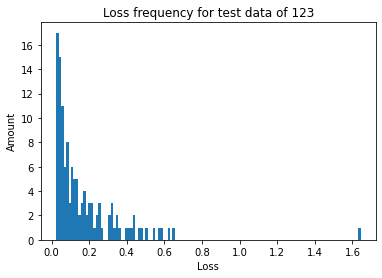

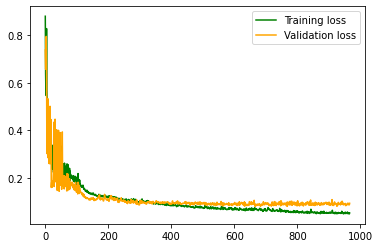

Loss average is: 0.17225937383650664
Loss mode is: [(0.16624, 1), (0.61838, 1), (0.12214, 1), (0.22142, 1), (0.50159, 1), (0.03876, 1), (0.08422, 1), (1.64292, 1), (0.19454, 1), (0.09036, 1)]
Loss median is: 0.10722


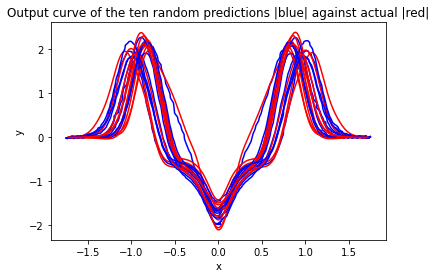

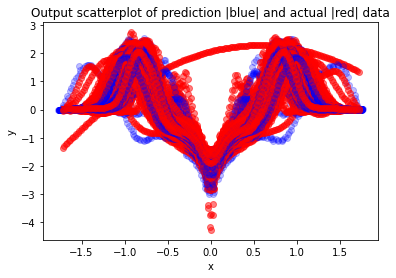

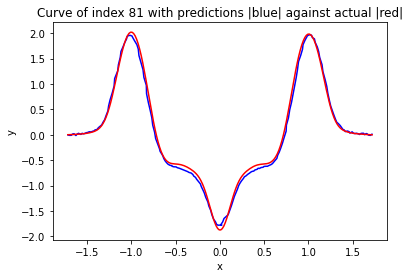

The loss of the curve 0.051399355667604556


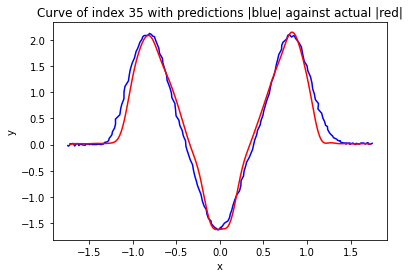

The loss of the curve 0.10721677441055467


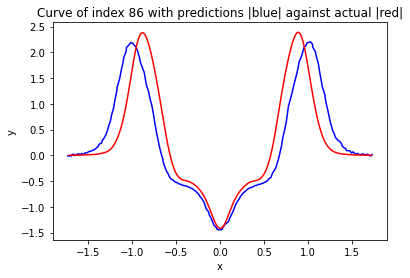

The loss of the curve 0.3405551821597591


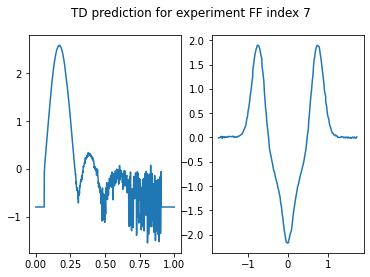

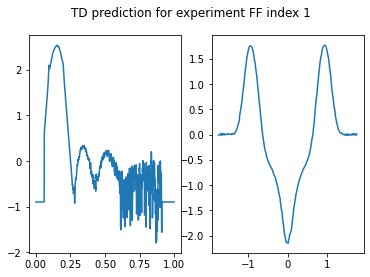

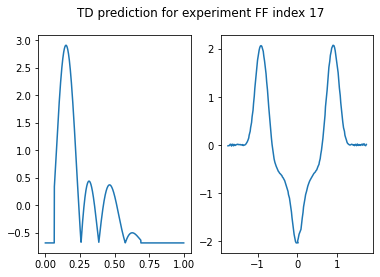

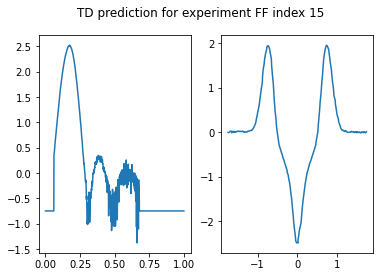

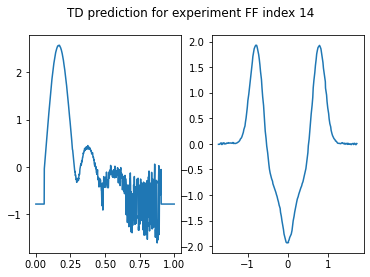

...

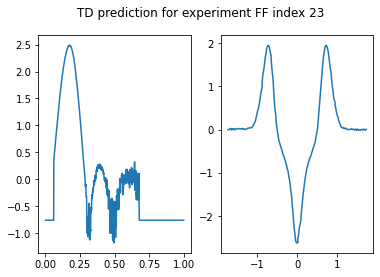

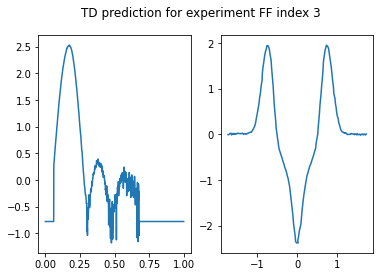

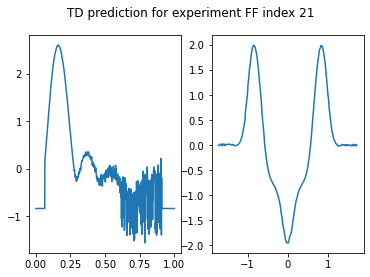

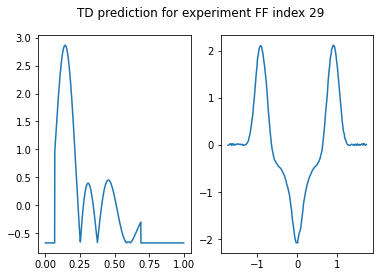

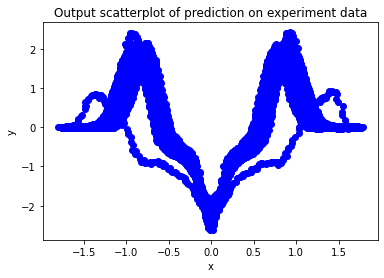

In [16]:
general_start_time = time.time()

callbacks = [EarlyStopping(monitor='val_loss', 
                       mode='min', 
                       patience=300, 
                       restore_best_weights=True)]

inputs = keras.Input(shape=(1000,))
x = layers.Dense(3000, activation='relu')(inputs)
x = layers.Dropout(0.05, seed = 42)(x)
x = layers.Dense(2000, activation='relu')(x)
x = layers.Dropout(0.1, seed = 42)(x)
x = layers.Dense(500, activation='relu')(x)
x = layers.Dropout(0.25, seed = 42)(x)
x = layers.Dense(2000, activation='relu')(x)
x = layers.Dropout(0.15, seed = 42)(x)
outputs = layers.Dense(400, activation='linear')(x)
model = keras.Model(inputs=inputs, outputs=outputs)
model.compile(optimizer=tf.keras.optimizers.Nadam(learning_rate=1e-3), loss='mean_absolute_error')

history = model.fit(train_input, train_output, batch_size=200, epochs=1500, validation_split=0.2, callbacks=callbacks, verbose=0)

general_end_time = time.time()

print('Used time: ' + str(general_end_time - general_start_time) + ' seconds')

results = metrics(test_output, model.predict(test_input))

plt.plot(history.history['loss'], color = 'green', label = 'Training loss')
plt.plot(history.history['val_loss'], color = 'orange', label = 'Validation loss')
plt.legend()
plt.show()

print('Loss average is: ' + str(results[0]))
print('Loss mode is: ' + str(results[1]))
print('Loss median is: ' + str(results[2]))
simulation_plots(test_output,model.predict(test_input))
experiment_predictions(exp_input,model.predict(exp_input))

Used time: 404.8089680671692 seconds


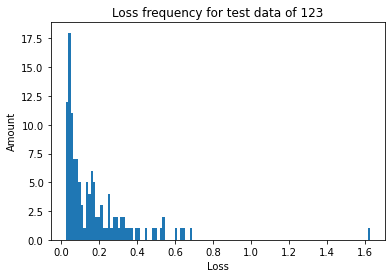

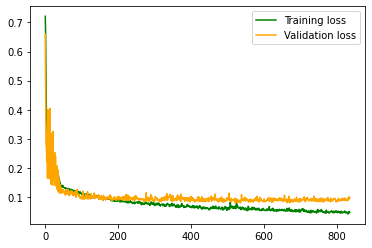

Loss average is: 0.1764592794321477
Loss mode is: [(0.08004, 2), (0.1706, 2), (0.21635, 1), (0.62424, 1), (0.0734, 1), (0.19101, 1), (0.411, 1), (0.04553, 1), (0.11955, 1), (1.62793, 1)]
Loss median is: 0.10735


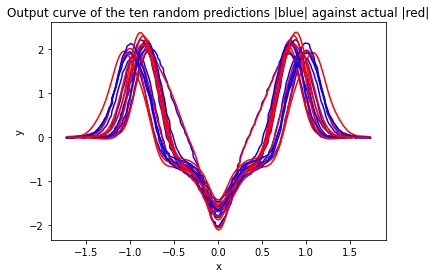

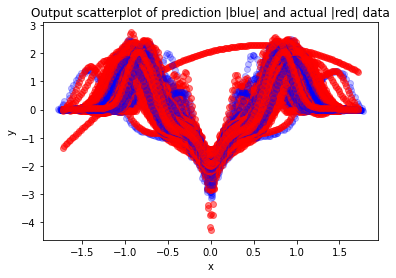

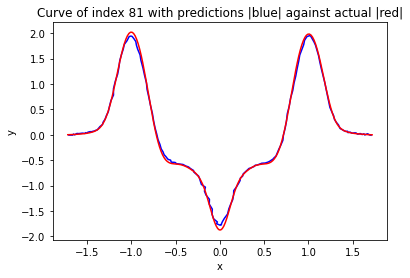

The loss of the curve 0.0324805961285285


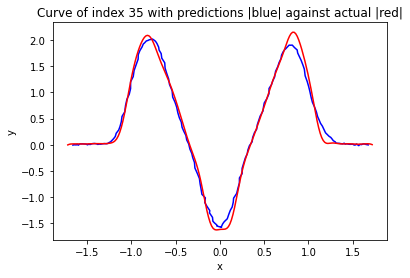

The loss of the curve 0.1073456262895916


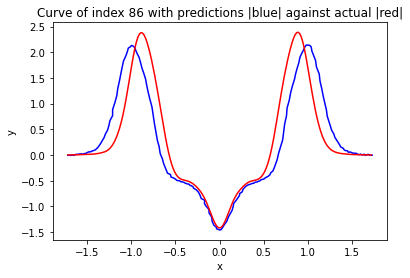

The loss of the curve 0.32381356715780063


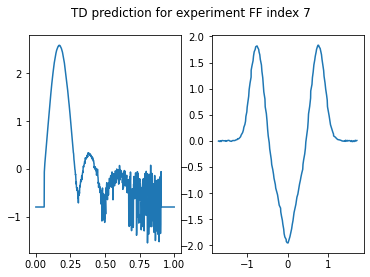

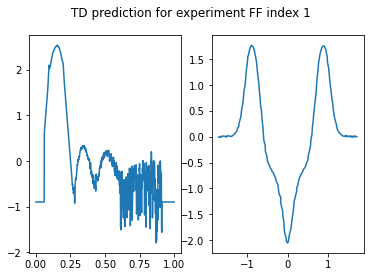

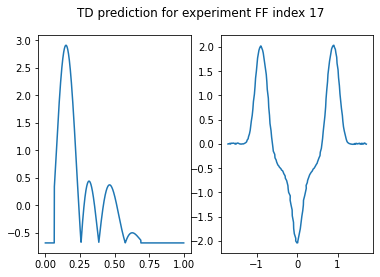

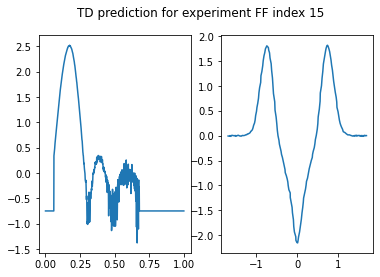

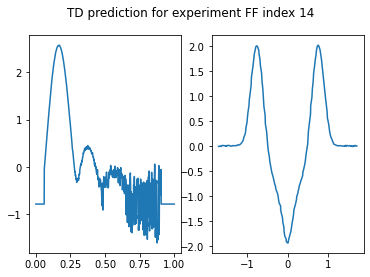

...

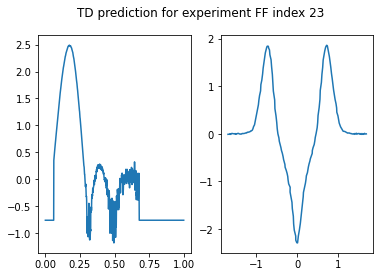

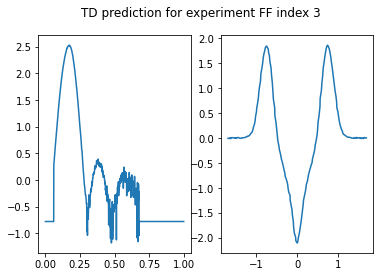

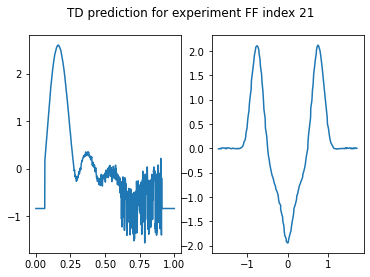

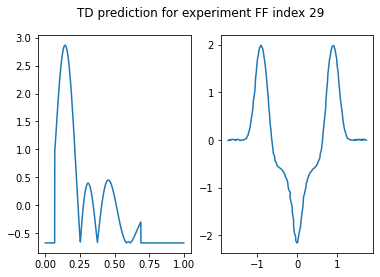

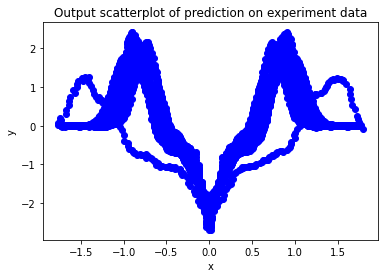

In [17]:
general_start_time = time.time()

callbacks = [EarlyStopping(monitor='val_loss', 
                       mode='min', 
                       patience=300, 
                       restore_best_weights=True)]

inputs = keras.Input(shape=(1000,))
x = layers.Dense(3000, activation='relu')(inputs)
x = layers.Dropout(0.05, seed = 42)(x)
x = layers.Dense(2000, activation='relu')(x)
x = layers.Dropout(0.1, seed = 42)(x)
x = layers.Dense(500, activation='relu')(x)
x = layers.Dropout(0.25, seed = 42)(x)
x = layers.Dense(2000, activation='relu')(x)
x = layers.Dropout(0.15, seed = 42)(x)
outputs = layers.Dense(400, activation='linear')(x)
model = keras.Model(inputs=inputs, outputs=outputs)
model.compile(optimizer=tf.keras.optimizers.Nadam(learning_rate=1e-3), loss='mean_absolute_error')

history = model.fit(train_input, train_output, batch_size=60, epochs=2000, validation_split=0.2, callbacks=callbacks, verbose=0)

general_end_time = time.time()

print('Used time: ' + str(general_end_time - general_start_time) + ' seconds')

results = metrics(test_output, model.predict(test_input))

plt.plot(history.history['loss'], color = 'green', label = 'Training loss')
plt.plot(history.history['val_loss'], color = 'orange', label = 'Validation loss')
plt.legend()
plt.show()

print('Loss average is: ' + str(results[0]))
print('Loss mode is: ' + str(results[1]))
print('Loss median is: ' + str(results[2]))
simulation_plots(test_output,model.predict(test_input))
experiment_predictions(exp_input,model.predict(exp_input))

Used time: 459.08185482025146 seconds


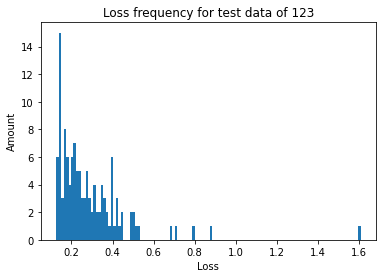

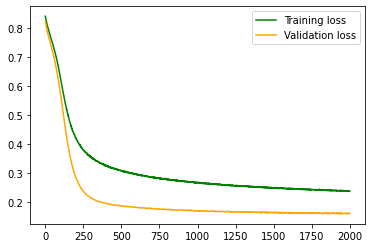

Loss average is: 0.28738279279420254
Loss mode is: [(0.26529, 2), (0.2424, 1), (0.50092, 1), (0.4428, 1), (0.4937, 1), (0.42508, 1), (0.12743, 1), (0.20147, 1), (1.60675, 1), (0.24948, 1)]
Loss median is: 0.23556


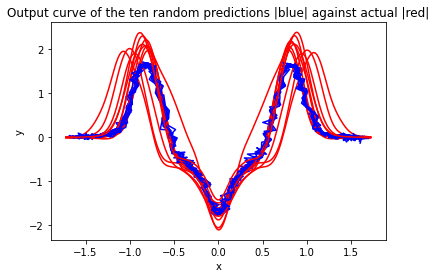

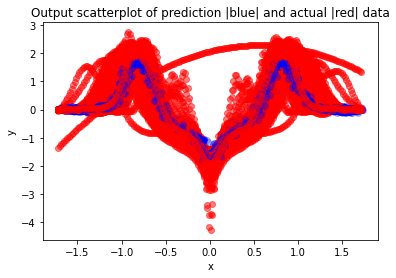

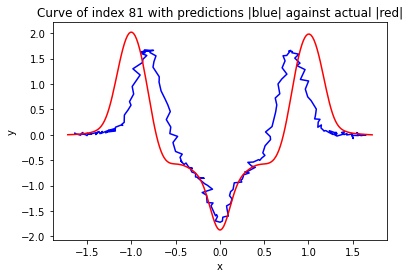

The loss of the curve 0.3942273947847232


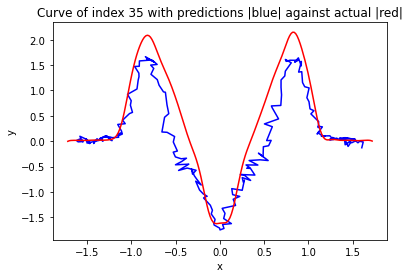

The loss of the curve 0.3615243069945066


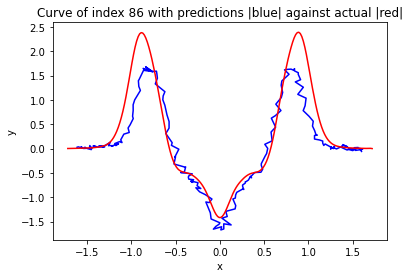

The loss of the curve 0.2316219997863479


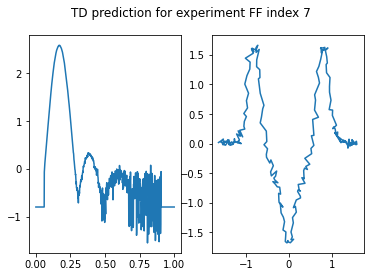

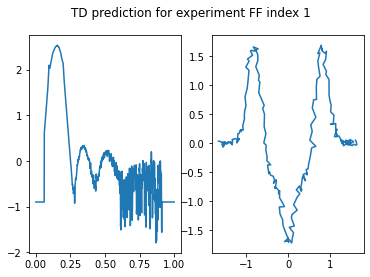

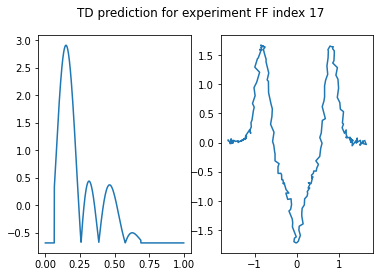

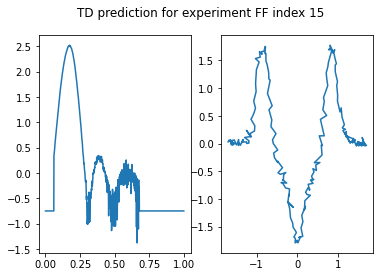

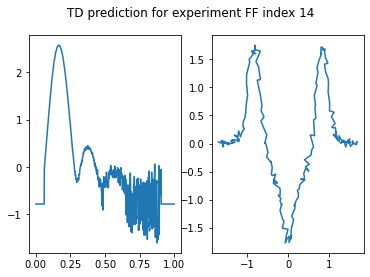

...

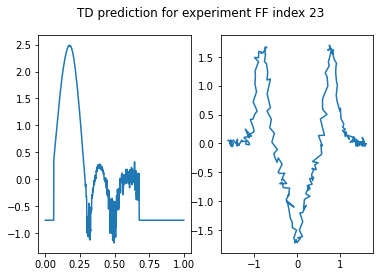

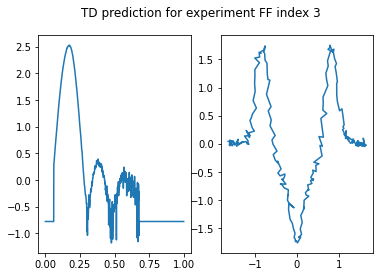

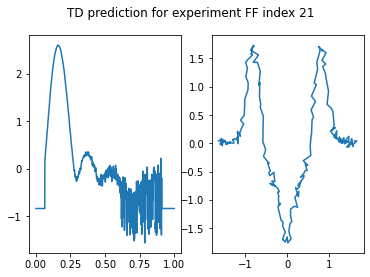

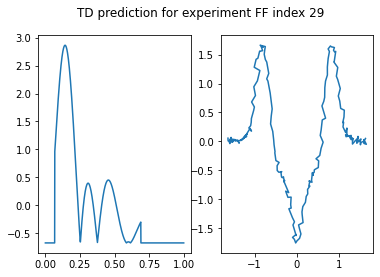

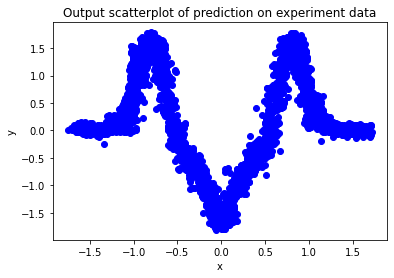

In [18]:
general_start_time = time.time()

callbacks = [EarlyStopping(monitor='val_loss', 
                       mode='min', 
                       patience=300, 
                       restore_best_weights=True)]

inputs = keras.Input(shape=(1000,))
x = layers.Dense(3000, activation='relu')(inputs)
x = layers.Dropout(0.05, seed = 42)(x)
x = layers.Dense(2000, activation='relu')(x)
x = layers.Dropout(0.1, seed = 42)(x)
x = layers.Dense(500, activation='relu')(x)
x = layers.Dropout(0.25, seed = 42)(x)
x = layers.Dense(2000, activation='relu')(x)
x = layers.Dropout(0.15, seed = 42)(x)
outputs = layers.Dense(400, activation='linear')(x)
model = keras.Model(inputs=inputs, outputs=outputs)
model.compile(optimizer=tf.keras.optimizers.SGD(learning_rate=1e-3), loss='mean_absolute_error')

history = model.fit(train_input, train_output, batch_size=60, epochs=2000, validation_split=0.2, callbacks=callbacks, verbose=0)

general_end_time = time.time()

print('Used time: ' + str(general_end_time - general_start_time) + ' seconds')

results = metrics(test_output, model.predict(test_input))

plt.plot(history.history['loss'], color = 'green', label = 'Training loss')
plt.plot(history.history['val_loss'], color = 'orange', label = 'Validation loss')
plt.legend()
plt.show()

print('Loss average is: ' + str(results[0]))
print('Loss mode is: ' + str(results[1]))
print('Loss median is: ' + str(results[2]))
simulation_plots(test_output,model.predict(test_input))
experiment_predictions(exp_input,model.predict(exp_input))

Used time: 456.82141494750977 seconds


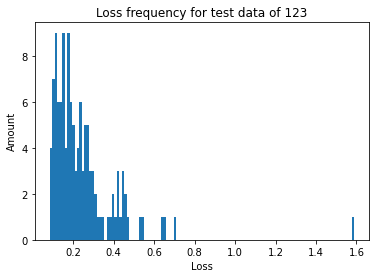

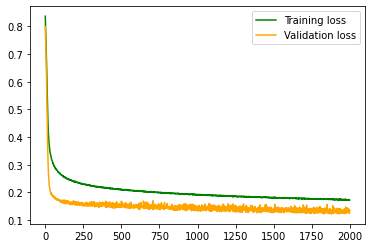

Loss average is: 0.24599555421550087
Loss mode is: [(0.16685, 2), (0.22394, 2), (0.21106, 1), (0.54817, 1), (0.43901, 1), (0.45104, 1), (0.40026, 1), (0.09891, 1), (0.19691, 1), (1.58863, 1)]
Loss median is: 0.19691


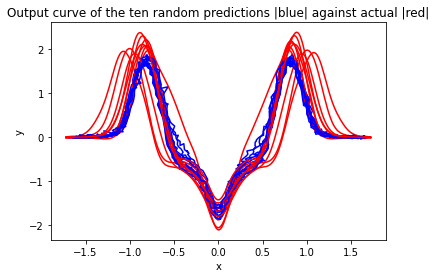

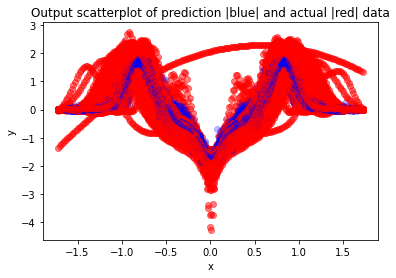

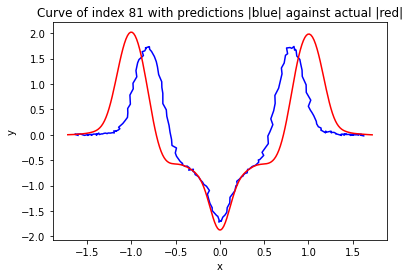

The loss of the curve 0.37500331138524


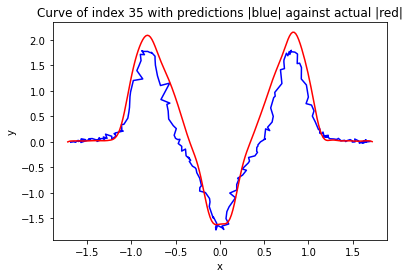

The loss of the curve 0.2378253811221461


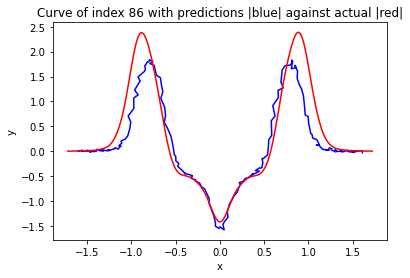

The loss of the curve 0.17569765356440617


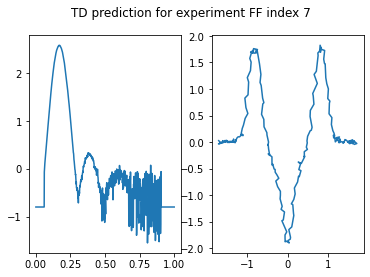

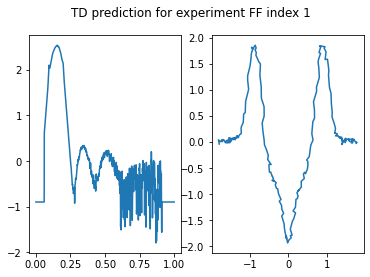

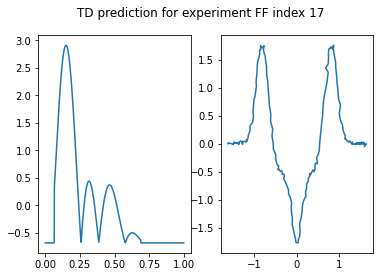

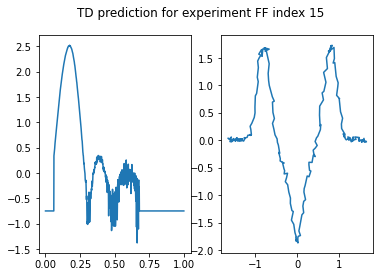

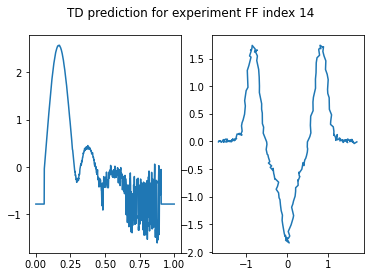

...

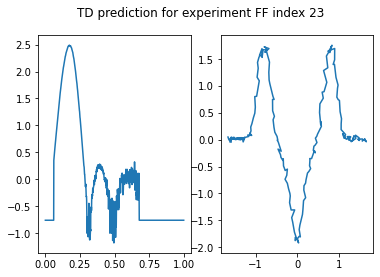

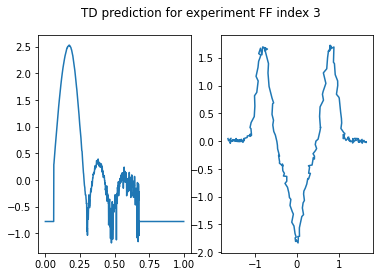

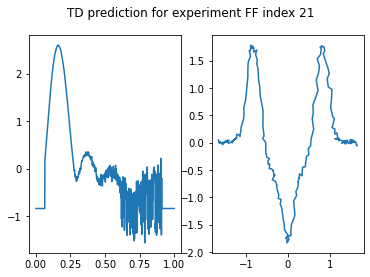

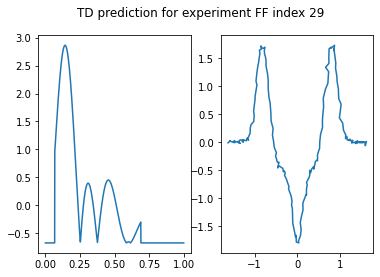

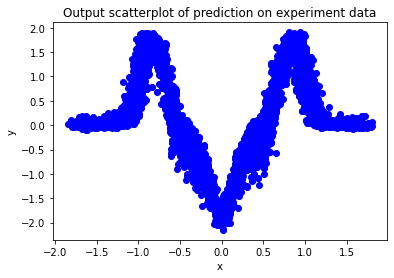

In [19]:
general_start_time = time.time()

callbacks = [EarlyStopping(monitor='val_loss', 
                       mode='min', 
                       patience=300, 
                       restore_best_weights=True)]

inputs = keras.Input(shape=(1000,))
x = layers.Dense(3000, activation='relu')(inputs)
x = layers.Dropout(0.05, seed = 42)(x)
x = layers.Dense(2000, activation='relu')(x)
x = layers.Dropout(0.1, seed = 42)(x)
x = layers.Dense(500, activation='relu')(x)
x = layers.Dropout(0.25, seed = 42)(x)
x = layers.Dense(2000, activation='relu')(x)
x = layers.Dropout(0.15, seed = 42)(x)
outputs = layers.Dense(400, activation='linear')(x)
model = keras.Model(inputs=inputs, outputs=outputs)
model.compile(optimizer=tf.keras.optimizers.SGD(learning_rate=1e-2), loss='mean_absolute_error')

history = model.fit(train_input, train_output, batch_size=60, epochs=2000, validation_split=0.2, callbacks=callbacks, verbose=0)

general_end_time = time.time()

print('Used time: ' + str(general_end_time - general_start_time) + ' seconds')

results = metrics(test_output, model.predict(test_input))

plt.plot(history.history['loss'], color = 'green', label = 'Training loss')
plt.plot(history.history['val_loss'], color = 'orange', label = 'Validation loss')
plt.legend()
plt.show()

print('Loss average is: ' + str(results[0]))
print('Loss mode is: ' + str(results[1]))
print('Loss median is: ' + str(results[2]))
simulation_plots(test_output,model.predict(test_input))
experiment_predictions(exp_input,model.predict(exp_input))

Used time: 457.0687096118927 seconds


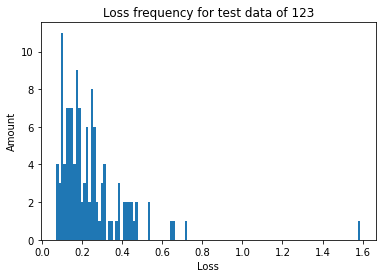

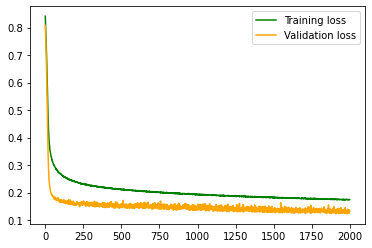

Loss average is: 0.24155911912897463
Loss mode is: [(0.20811, 1), (0.53607, 1), (0.43552, 1), (0.45252, 1), (0.38918, 1), (0.09502, 1), (0.18284, 1), (1.58891, 1), (0.24817, 1), (0.16608, 1)]
Loss median is: 0.18948


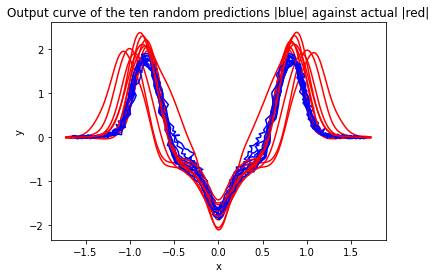

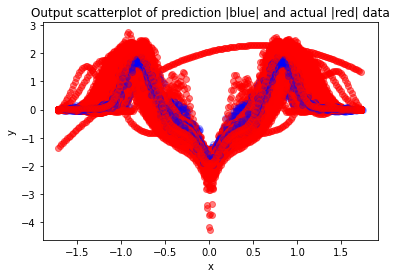

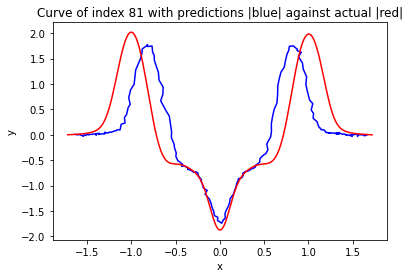

The loss of the curve 0.3746210720337651


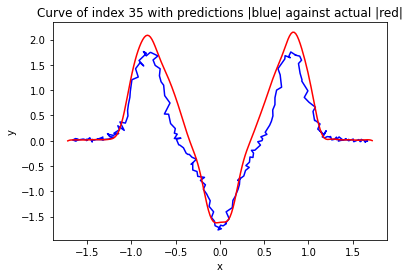

The loss of the curve 0.2517085373608525


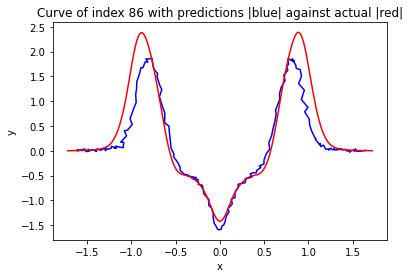

The loss of the curve 0.16945266170089654


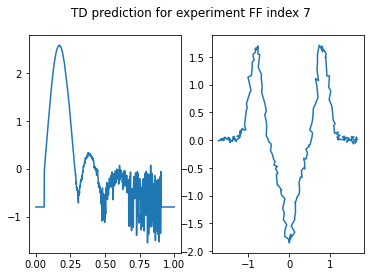

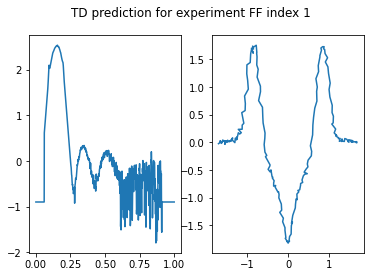

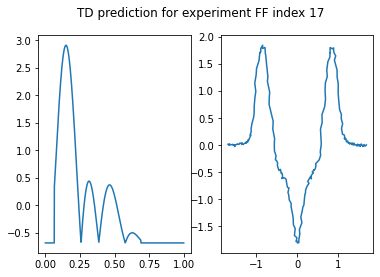

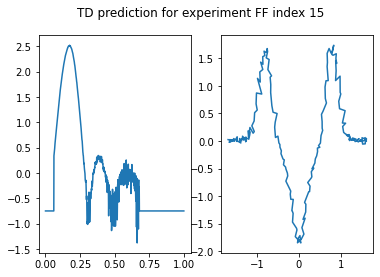

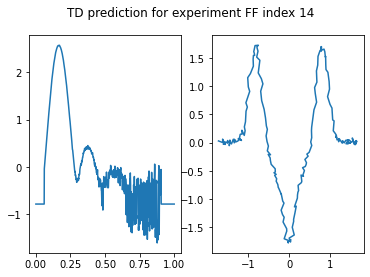

...

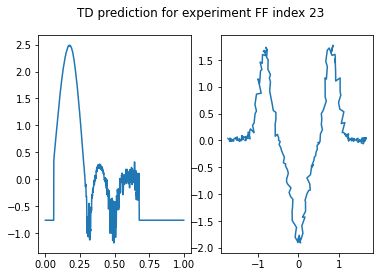

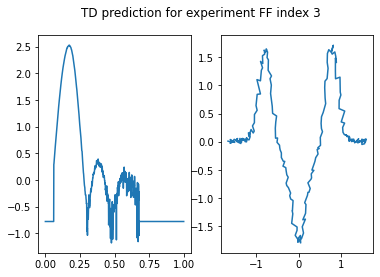

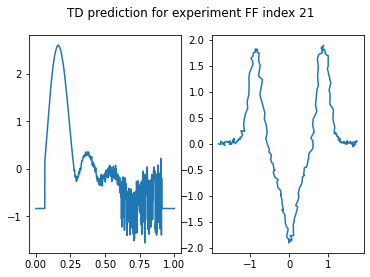

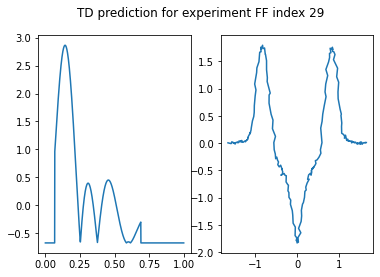

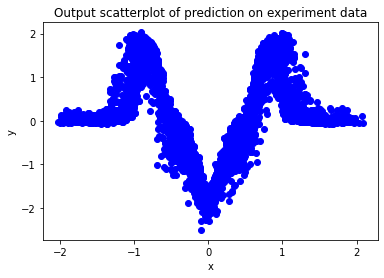

In [20]:
general_start_time = time.time()

callbacks = [EarlyStopping(monitor='val_loss', 
                       mode='min', 
                       patience=300, 
                       restore_best_weights=True)]

inputs = keras.Input(shape=(1000,))
x = layers.Dense(3000, activation='relu')(inputs)
x = layers.Dropout(0.05, seed = 42)(x)
x = layers.Dense(2000, activation='relu')(x)
x = layers.Dropout(0.1, seed = 42)(x)
x = layers.Dense(500, activation='relu')(x)
x = layers.Dropout(0.25, seed = 42)(x)
x = layers.Dense(2000, activation='relu')(x)
x = layers.Dropout(0.15, seed = 42)(x)
outputs = layers.Dense(400, activation='linear')(x)
model = keras.Model(inputs=inputs, outputs=outputs)
model.compile(optimizer=tf.keras.optimizers.SGD(), loss='mean_absolute_error')

history = model.fit(train_input, train_output, batch_size=60, epochs=2000, validation_split=0.2, callbacks=callbacks, verbose=0)

general_end_time = time.time()

print('Used time: ' + str(general_end_time - general_start_time) + ' seconds')

results = metrics(test_output, model.predict(test_input))

plt.plot(history.history['loss'], color = 'green', label = 'Training loss')
plt.plot(history.history['val_loss'], color = 'orange', label = 'Validation loss')
plt.legend()
plt.show()

print('Loss average is: ' + str(results[0]))
print('Loss mode is: ' + str(results[1]))
print('Loss median is: ' + str(results[2]))
simulation_plots(test_output,model.predict(test_input))
experiment_predictions(exp_input,model.predict(exp_input))

Used time: 241.0757613182068 seconds


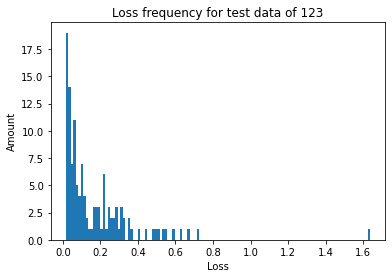

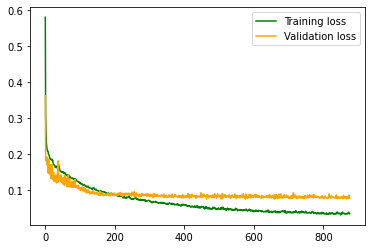

Loss average is: 0.17084797196988008
Loss mode is: [(0.11971, 1), (0.62628, 1), (0.07227, 1), (0.21584, 1), (0.5548, 1), (0.03922, 1), (0.21809, 1), (1.63763, 1), (0.16211, 1), (0.10092, 1)]
Loss median is: 0.09667


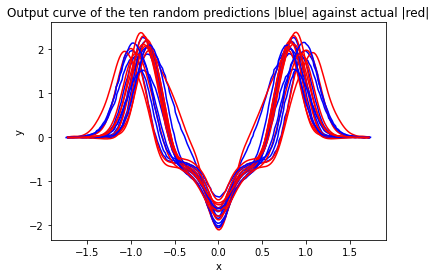

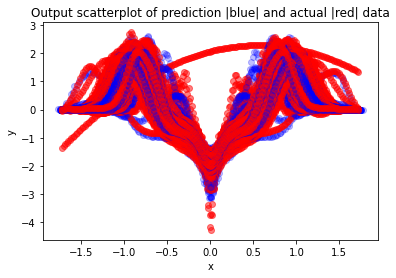

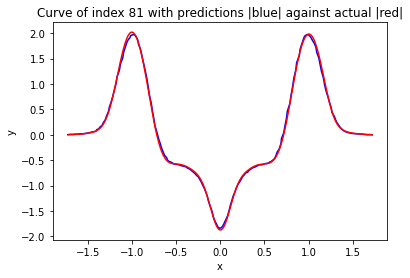

The loss of the curve 0.02186876352525981


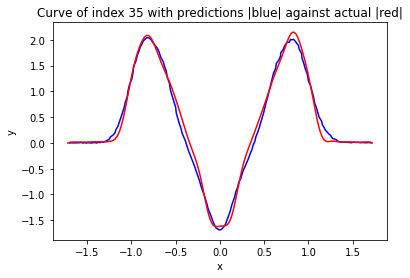

The loss of the curve 0.08858692168222955


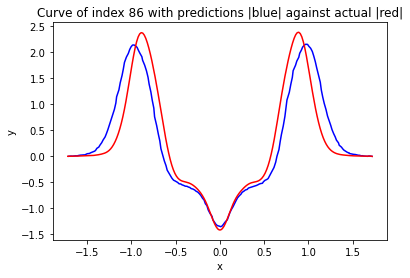

The loss of the curve 0.29920427929975857


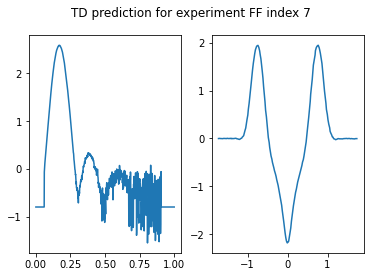

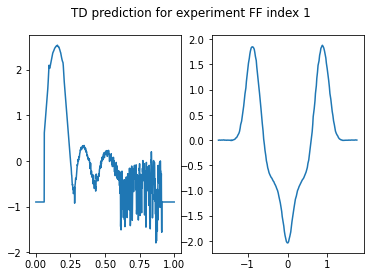

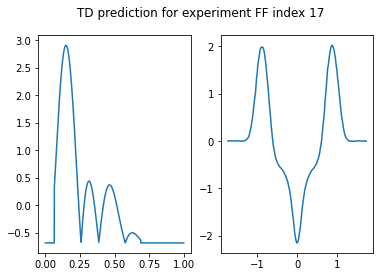

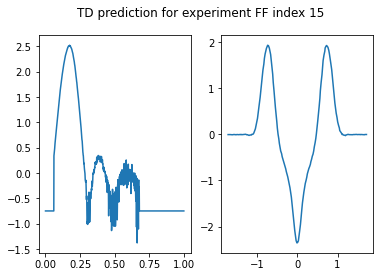

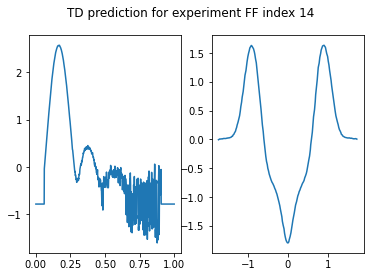

...

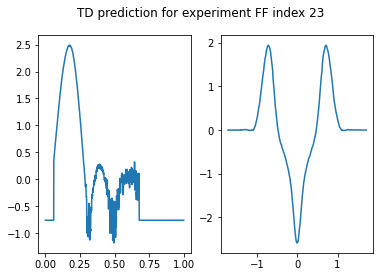

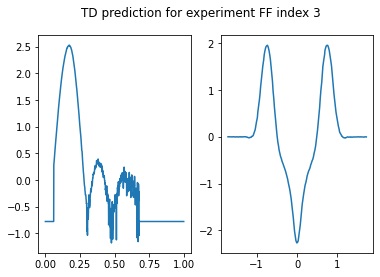

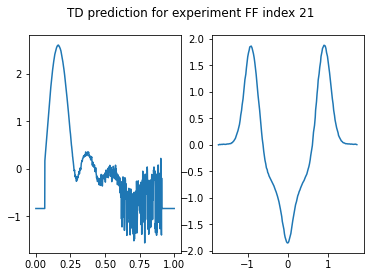

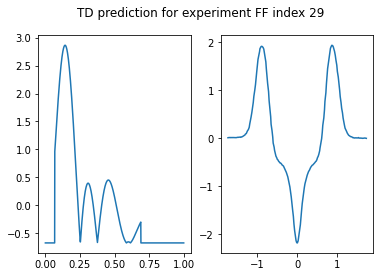

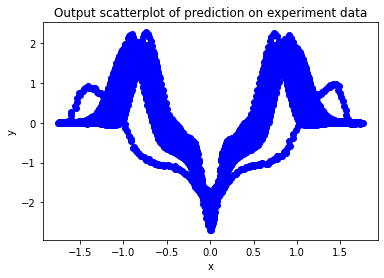

In [21]:
general_start_time = time.time()

callbacks = [EarlyStopping(monitor='val_loss', 
                       mode='min', 
                       patience=300, 
                       restore_best_weights=True)]

inputs = keras.Input(shape=(1000,))
x = layers.Dense(3000, activation='relu')(inputs)
x = layers.Dropout(0.05, seed = 42)(x)
x = layers.Dense(2000, activation='relu')(x)
x = layers.Dropout(0.1, seed = 42)(x)
x = layers.Dense(500, activation='relu')(x)
x = layers.Dropout(0.25, seed = 42)(x)
x = layers.Dense(2000, activation='relu')(x)
x = layers.Dropout(0.15, seed = 42)(x)
outputs = layers.Dense(400, activation='linear')(x)
model = keras.Model(inputs=inputs, outputs=outputs)
model.compile(optimizer=tf.keras.optimizers.Adamax(), loss='mean_absolute_error')

history = model.fit(train_input, train_output, batch_size=60, epochs=2000, validation_split=0.2, callbacks=callbacks, verbose=0)

general_end_time = time.time()

print('Used time: ' + str(general_end_time - general_start_time) + ' seconds')

results = metrics(test_output, model.predict(test_input))

plt.plot(history.history['loss'], color = 'green', label = 'Training loss')
plt.plot(history.history['val_loss'], color = 'orange', label = 'Validation loss')
plt.legend()
plt.show()

print('Loss average is: ' + str(results[0]))
print('Loss mode is: ' + str(results[1]))
print('Loss median is: ' + str(results[2]))
simulation_plots(test_output,model.predict(test_input))
experiment_predictions(exp_input,model.predict(exp_input))

Trial 254 Complete [00h 01m 10s]
loss: 0.10849815607070923

Best loss So Far: 0.10310223698616028
Total elapsed time: 00h 23m 25s
INFO:tensorflow:Oracle triggered exit
{'num_layers': 4, 'dense_0_units': 1500, 'dropout_0': 0.1, 'dense_1_units': 500, 'dropout_1': 0.15000000000000002, 'dense_2_units': 500, 'dropout_2': 0.05, 'dense_3_units': 2500, 'dropout_3': 0.05, 'dense_4_units': 1500, 'dropout_4': 0.1, 'tuner/epochs': 100, 'tuner/initial_epoch': 34, 'tuner/bracket': 1, 'tuner/round': 1, 'tuner/trial_id': '0242'}
Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 1500)              1501500   
_________________________________________________________________
dropout (Dropout)            (None, 1500)              0         
_________________________________________________________________
dense_1 (Dense)              (None, 500)               750500    

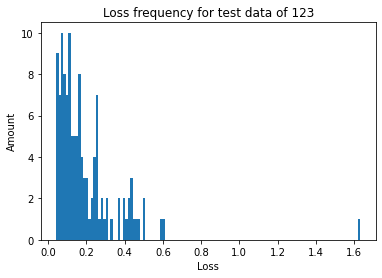

Loss average is: 0.19745302543786333
Loss mode is: [(0.20653, 1), (0.59284, 1), (0.37051, 1), (0.1118, 1), (0.42778, 1), (0.0624, 1), (0.16082, 1), (1.63365, 1), (0.2647, 1), (0.09932, 1)]
Loss median is: 0.14663


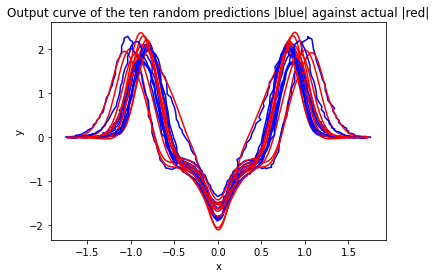

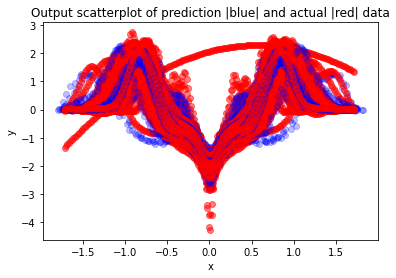

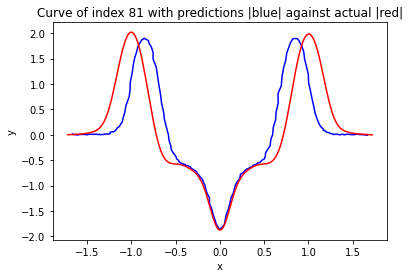

The loss of the curve 0.33430522601128587


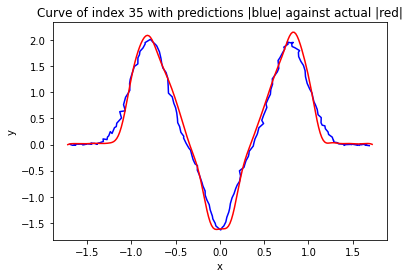

The loss of the curve 0.12935422273653274


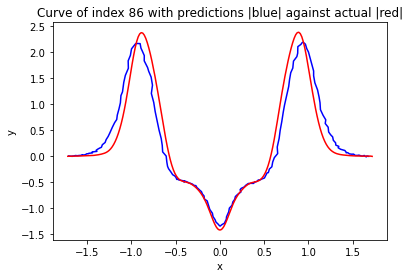

The loss of the curve 0.240368955779957


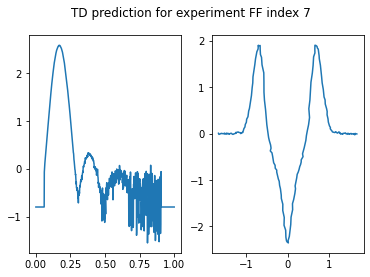

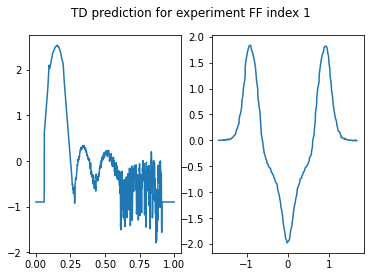

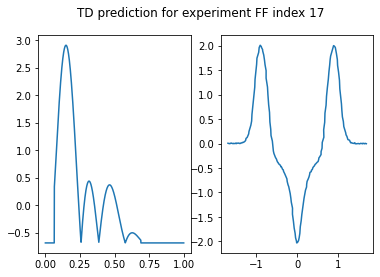

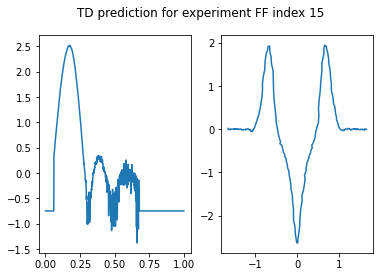

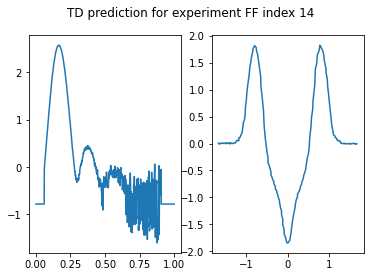

...

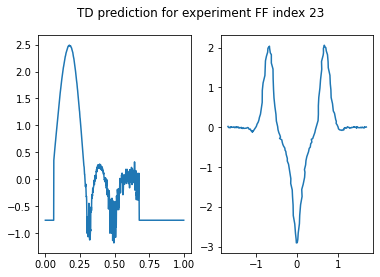

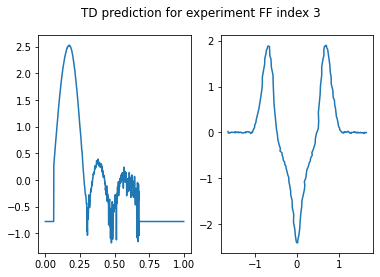

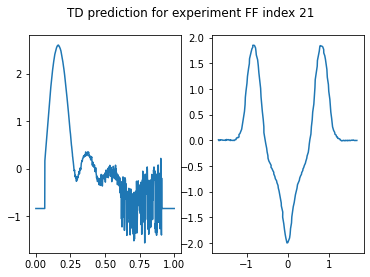

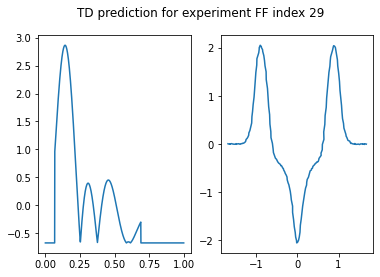

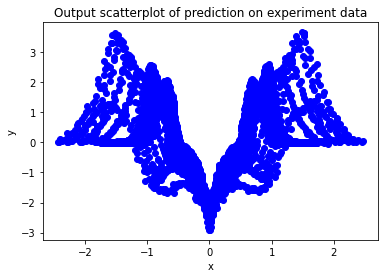

In [22]:
def build_model(hp):
    model = keras.Sequential()
    
    model.add(layers.Input(shape=(1000,)))
    
    for i in range(hp.Int('num_layers', 1, 5)):
        model.add(layers.Dense(units=hp.Int(f'dense_{i}_units', min_value=500, max_value=3000, step=500), 
                               activation='relu'))
        model.add(layers.Dropout(hp.Float(f'dropout_{i}', min_value=0.05, max_value=0.30, step=0.05), seed=42))
    
    model.add(layers.Dense(units=400, activation = 'linear'))
    
    model.compile(optimizer=tf.keras.optimizers.Adamax(),loss='mean_absolute_error')
    
    return model

tuner = Hyperband(
    build_model,
    objective='loss',
    max_epochs=100,
    factor=3,
    directory='my_dir',
    project_name='FF_to_TD_12')

tuner.search(train_input, train_output,
             epochs=100,
             validation_data=(test_input, test_output))

best_model = tuner.get_best_models(num_models=1)[0]

best_hps = tuner.get_best_hyperparameters()[0]
print(best_hps.values)

two_best_models = tuner.get_best_models(num_models=1)
print(two_best_models[0].summary())

results = metrics(test_output, best_model.predict(test_input))
print('Loss average is: ' + str(results[0]))
print('Loss mode is: ' + str(results[1]))
print('Loss median is: ' + str(results[2]))
simulation_plots(test_output,best_model.predict(test_input))
experiment_predictions(exp_input,best_model.predict(exp_input))

Used time: 169.98007464408875 seconds


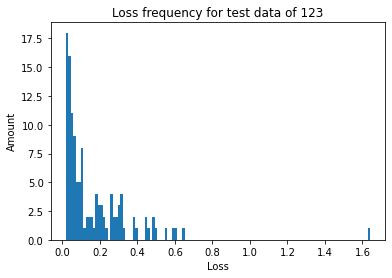

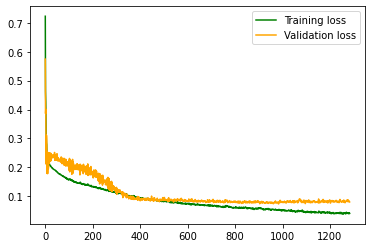

Loss average is: 0.16489602107154647
Loss mode is: [(0.19213, 1), (0.60722, 1), (0.11428, 1), (0.19516, 1), (0.44773, 1), (0.06266, 1), (0.25673, 1), (1.64146, 1), (0.09414, 1), (0.10272, 1)]
Loss median is: 0.09124


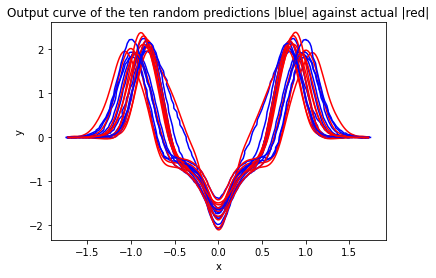

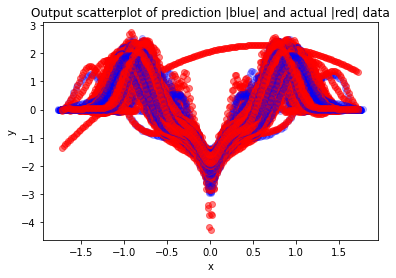

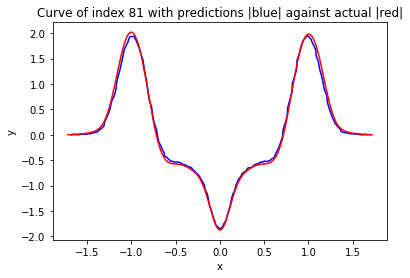

The loss of the curve 0.03753923305884696


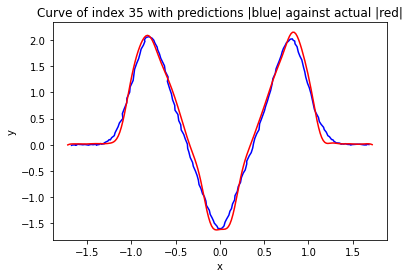

The loss of the curve 0.10336454563956345


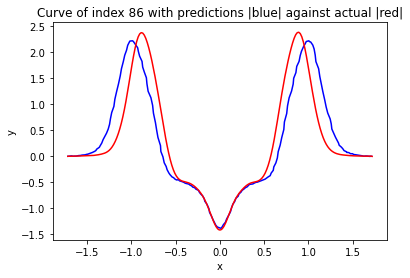

The loss of the curve 0.31936027770190667


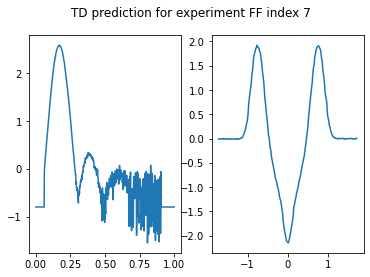

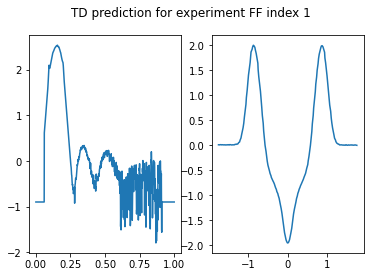

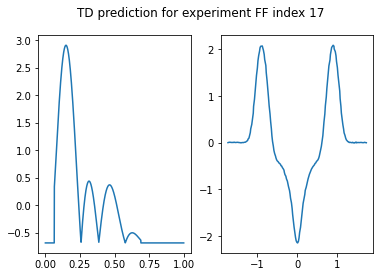

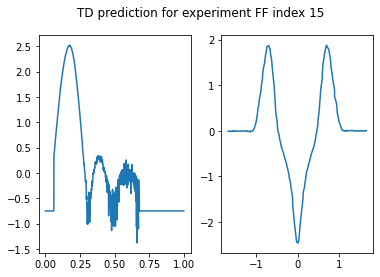

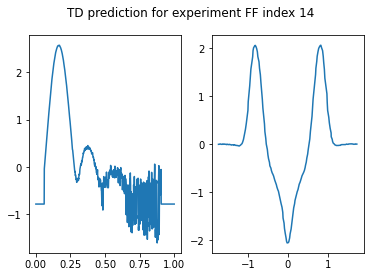

...

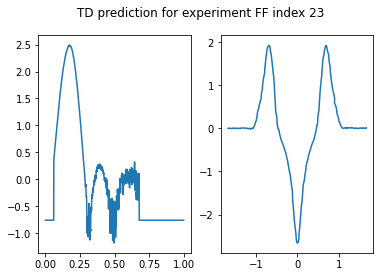

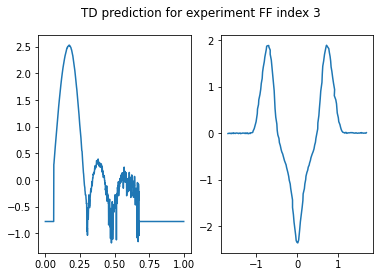

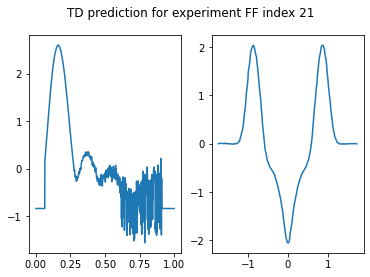

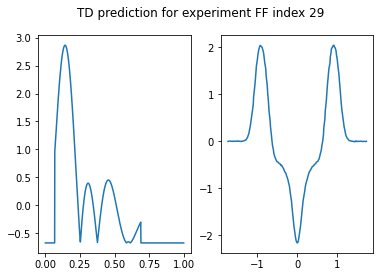

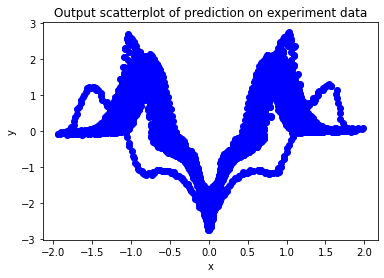

In [23]:
general_start_time = time.time()

callbacks = [EarlyStopping(monitor='val_loss', 
                       mode='min', 
                       patience=300, 
                       restore_best_weights=True)]

inputs = keras.Input(shape=(1000,))
x = layers.Dense(1500, activation='relu')(inputs)
x = layers.Dropout(0.1, seed = 42)(x)
x = layers.Dense(500, activation='relu')(x)
x = layers.Dropout(0.15, seed = 42)(x)
x = layers.Dense(500, activation='relu')(x)
x = layers.Dropout(0.05, seed = 42)(x)
x = layers.Dense(2500, activation='relu')(x)
x = layers.Dropout(0.05, seed = 42)(x)
x = layers.Dense(1500, activation='relu')(x)
x = layers.Dropout(0.1, seed = 42)(x)
outputs = layers.Dense(400, activation='linear')(x)
model = keras.Model(inputs=inputs, outputs=outputs)
model.compile(optimizer=tf.keras.optimizers.Adamax(), loss='mean_absolute_error')

history = model.fit(train_input, train_output, batch_size=200, epochs=2000, validation_split=0.2, callbacks=callbacks, verbose=0)

general_end_time = time.time()

print('Used time: ' + str(general_end_time - general_start_time) + ' seconds')

results = metrics(test_output, model.predict(test_input))

plt.plot(history.history['loss'], color = 'green', label = 'Training loss')
plt.plot(history.history['val_loss'], color = 'orange', label = 'Validation loss')
plt.legend()
plt.show()

print('Loss average is: ' + str(results[0]))
print('Loss mode is: ' + str(results[1]))
print('Loss median is: ' + str(results[2]))
simulation_plots(test_output,model.predict(test_input))
experiment_predictions(exp_input,model.predict(exp_input))